In [ ]:
!pip install pycocotools
!pip uninstall -y tensorflow-io
!pip install tensorflow-io

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 7.7 MB/s eta 0:00:00a 0:00:01
Found existing installation: tensorflow-io 0.35.0
Uninstalling tensorflow-io-0.35.0:
  Successfully uninstalled tensorflow-io-0.35.0
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 MB 33.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.1/5.1 MB 85.8 MB/s eta 0:00:00:00:01
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.35.0
    Uninstalling tensorflow-io-gcs-filesystem-0.35.0:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.35.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.8.1 requires wurlitzer, which is not installed.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.1.1 which is incompatible.


### Importing Required Libraries¶

In [ ]:
import warnings
warnings.filterwarnings(action="ignore")

import os
import pylab
import array
import numpy as np
import skimage.io as io
from random import shuffle
from pycocotools.coco import COCO
from pycocotools import mask as maskUtils

from tensorflow import keras
from collections import defaultdict

from scipy.ndimage import binary_erosion, binary_dilation
from scipy.ndimage.filters import gaussian_filter

import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches
plt.style.use("ggplot")
%matplotlib inline

2024-04-22 10:08:50.716373: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-22 10:08:50.716466: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-22 10:08:50.838146: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
ANNOTATION_FILE_VAL = '/kaggle/input/rm-segmentation-assignment-dataset/validation-300/labels.json'
ANNOTATION_FILE_TRAIN = '/kaggle/input/rm-segmentation-assignment-dataset/train-300/labels.json'

coco_train = COCO(ANNOTATION_FILE_TRAIN)
coco_val = COCO(ANNOTATION_FILE_VAL)

num_train_images = len(coco_train.getImgIds())
num_val_images = len(coco_val.getImgIds())

print("Number of images in training set:", num_train_images)
print("Number of images in validation set:", num_val_images)

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
loading annotations into memory...
Done (t=0.07s)
creating index...
index created!
Number of images in training set: 300
Number of images in validation set: 300


In [ ]:
coco_train.getCatIds(['person', 'cake', 'dog', 'car'])

[15, 16, 25, 41]

In [ ]:
# Category IDs.
cat_ids = coco_train.getCatIds()
print(f"Number of Unique Categories: {len(cat_ids)}")
print("Category IDs:")
print(cat_ids)  # The IDs are not necessarily consecutive.

Number of Unique Categories: 63
Category IDs:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]


In [ ]:
# All categories.
cats = coco_train.loadCats(cat_ids)
cat_names = [cat["name"] for cat in cats]
print("Categories Names:")
print(cat_names)

Categories Names:
['airplane', 'backpack', 'banana', 'baseball bat', 'baseball glove', 'bear', 'bench', 'bicycle', 'bird', 'boat', 'book', 'bottle', 'bowl', 'broccoli', 'bus', 'cake', 'car', 'carrot', 'cat', 'cell phone', 'chair', 'clock', 'cow', 'cup', 'dining table', 'dog', 'donut', 'elephant', 'fire hydrant', 'fork', 'frisbee', 'giraffe', 'handbag', 'horse', 'hot dog', 'kite', 'knife', 'laptop', 'motorcycle', 'oven', 'parking meter', 'person', 'pizza', 'potted plant', 'refrigerator', 'remote', 'sandwich', 'scissors', 'skateboard', 'skis', 'spoon', 'sports ball', 'stop sign', 'suitcase', 'surfboard', 'tennis racket', 'tie', 'traffic light', 'train', 'truck', 'umbrella', 'vase', 'wine glass']


In [ ]:
# Category ID -> Category Name.
query_id = cat_ids[15]
query_annotation = coco_train.loadCats([query_id])[0]
query_name = query_annotation["name"]
query_supercategory = query_annotation["supercategory"]
print("Category ID -> Category Name:")
print(
    f"Category ID: {query_id}, Category Name: {query_name}, Supercategory: {query_supercategory}"
)

Category ID -> Category Name:
Category ID: 15, Category Name: cake, Supercategory: food


In [ ]:
# Category Name -> Category ID.
query_name = cat_names[16]
query_id = coco_train.getCatIds(catNms=[query_name])[0]
print("Category Name -> ID:")
print(f"Category Name: {query_name}, Category ID: {query_id}")

Category Name -> ID:
Category Name: car, Category ID: 16


In [ ]:
# Get the ID of all the images containing the object of the category.
img_ids = coco_train.getImgIds(catIds=[query_id])
print(f"Number of Images Containing {query_name}: {len(img_ids)}")

Number of Images Containing car: 283


In [ ]:
# Pick one image.
img_id = img_ids[2]
img_info = coco_train.loadImgs([img_id])[0]
img_file_name = img_info["file_name"]
img_url = img_info["coco_url"]
print(
    f"Image ID: {img_id}, File Name: {img_file_name}, Image URL: {img_url}"
)

Image ID: 3, File Name: 000000000328.jpg, Image URL: None


In [ ]:
# Get all the annotations for the specified image.
ann_ids = coco_train.getAnnIds(imgIds=[img_id], iscrowd=None)
anns = coco_train.loadAnns(ann_ids)
print(f"Annotations for Image ID {img_id}:")
print(anns)

Annotations for Image ID 3:
[{'id': 31, 'image_id': 3, 'category_id': 19, 'bbox': [434.75, 283.15, 35.01, 18.64], 'segmentation': [[439.0, 300.5, 433.5, 297.0, 435.0, 290.5, 460.0, 282.5, 468.5, 286.0, 468.0, 288.5, 450.0, 291.5, 446.0, 298.5, 439.0, 300.5]], 'area': 652.5864, 'iscrowd': 0, 'supercategory': 'electronic'}, {'id': 32, 'image_id': 3, 'category_id': 41, 'bbox': [44.81, 68.09, 223.8, 356.91], 'segmentation': [[201.0, 424.5, 180.5, 418.0, 194.5, 356.0, 184.5, 351.0, 195.5, 335.0, 193.5, 269.0, 182.0, 256.5, 165.0, 254.5, 156.5, 265.0, 120.5, 368.0, 116.0, 373.5, 103.0, 383.5, 60.0, 403.5, 56.0, 403.5, 43.5, 393.0, 80.5, 355.0, 89.5, 335.0, 99.5, 265.0, 106.5, 244.0, 115.5, 226.0, 133.5, 215.0, 129.5, 179.0, 139.5, 142.0, 140.5, 113.0, 161.0, 105.5, 174.5, 69.0, 188.0, 67.5, 197.0, 67.5, 210.0, 73.5, 218.5, 82.0, 224.0, 104.5, 267.5, 131.0, 255.5, 208.0, 243.5, 224.0, 247.5, 244.0, 233.5, 261.0, 233.5, 326.0, 214.5, 363.0, 213.5, 410.0, 201.0, 424.5]], 'area': 79876.458000000

### Displaying Image with Annotations

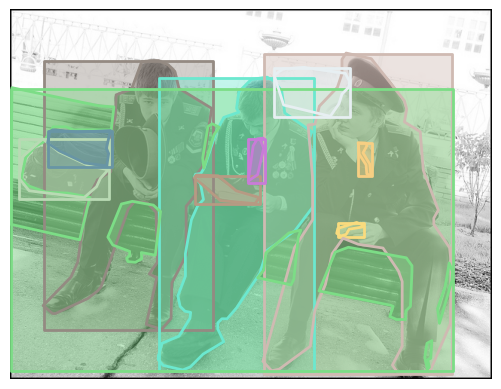

In [ ]:
# Use URL to load image.
data_path = "/kaggle/input/rm-segmentation-assignment-dataset/train-300/data"
# Load image from dataset
im = plt.imread(os.path.join(data_path,coco_train.loadImgs(img_id)[0]['file_name']))
# Save image and its labeled version.
plt.axis("off")
plt.imshow(np.asarray(im))
plt.savefig(f"{img_id}.jpg", bbox_inches="tight", pad_inches=0)
# Plot segmentation and bounding box.
coco_train.showAnns(anns, draw_bbox=True)
plt.savefig(f"{img_id}_annotated.jpg", bbox_inches="tight", pad_inches=0)
plt.show()

### Visualizing Category Distribution in the COCO Dataset

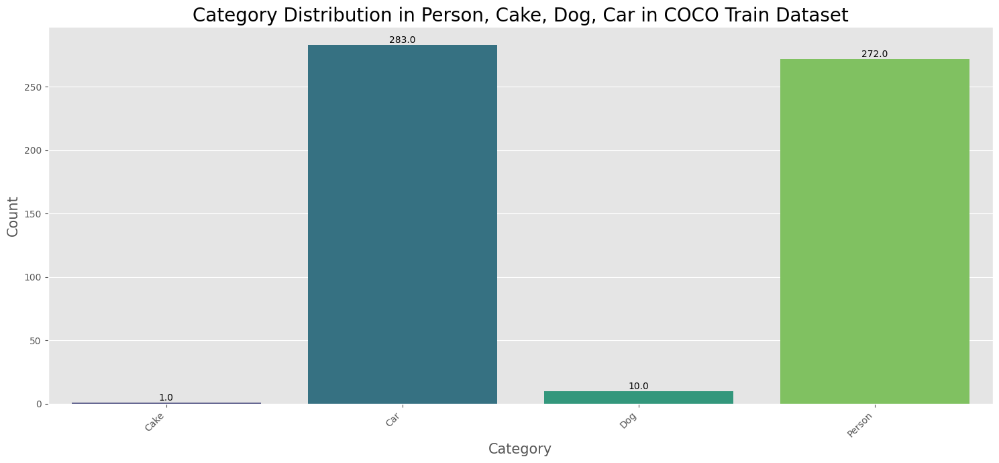

In [ ]:
included_categories = ['person', 'cake', 'dog', 'car']

# Filter categories based on names
catIDs = coco_train.getCatIds(catNms=included_categories)
cats = coco_train.loadCats(catIDs)

# Get category names
category_names = [cat['name'].title() for cat in cats]

# Get category counts
category_counts = [coco_train.getImgIds(catIds=[cat['id']]) for cat in cats]
category_counts = [len(img_ids) for img_ids in category_counts]

# Create a color palette for the plot
colors = sns.color_palette('viridis', len(category_names))

# Create a horizontal bar plot to visualize the category counts
plt.figure(figsize=(15, 7))
barplot = sns.barplot(y=category_counts, x=category_names, palette=colors)

for p in barplot.patches:
    h = p.get_height()
    barplot.text(p.get_x()+(p.get_width()/2), h, f"{h}", ha="center", va="bottom")

barplot.set_xlabel('Category', fontsize=15)
barplot.set_ylabel('Count', fontsize=15)
barplot.set_title('Category Distribution in Person, Cake, Dog, Car in COCO Train Dataset', fontsize=20)

# Rotate x-axis labels for better readability
barplot.set_xticklabels(labels=barplot.get_xticklabels(), rotation=45, ha='right')

plt.tight_layout()
plt.show()


### Visualizing Category Distribution as a Pie Chart

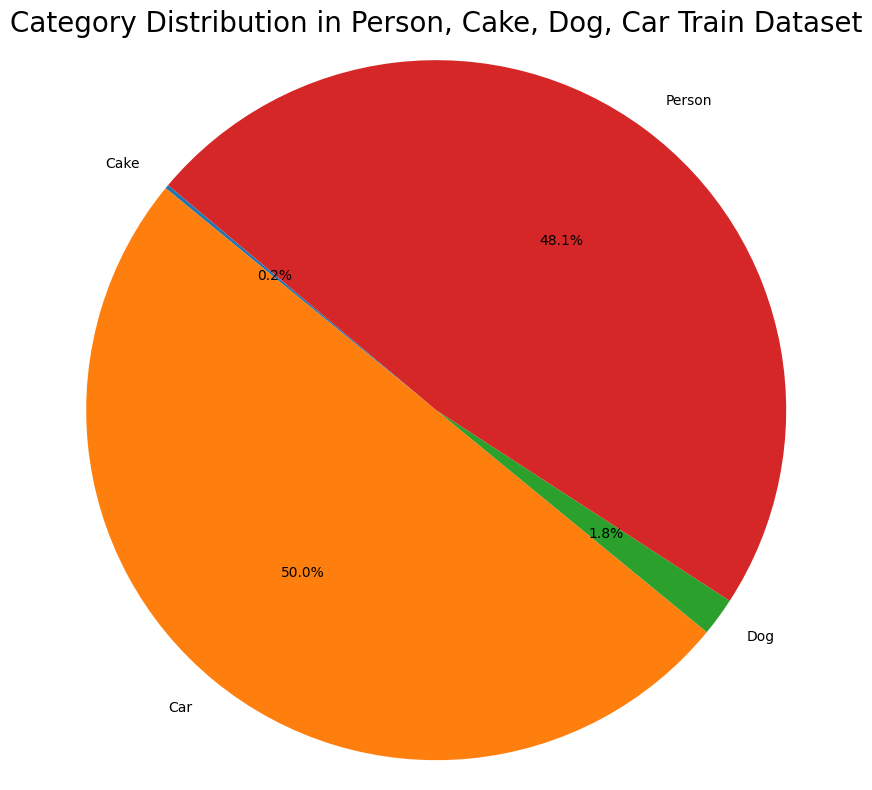

In [ ]:
included_categories = ['person', 'cake', 'dog', 'car']

# Filter categories based on names
catIDs = coco_train.getCatIds(catNms=included_categories)
cats = coco_train.loadCats(catIDs)

# Get category names
category_names = [cat['name'].title() for cat in cats]

# Get category counts
category_counts = [coco_train.getImgIds(catIds=[cat['id']]) for cat in cats]
category_counts = [len(img_ids) for img_ids in category_counts]

# Calculate percentages
total_images = len(coco_train.getImgIds())
percentages = [(count / total_images) * 100 for count in category_counts]

# Create a color palette for the plot
colors = plt.cm.tab10(range(len(category_names)))  # Using the 'tab10' colormap for more colors

# Create a pie chart to visualize percentages
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=category_names, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title('Category Distribution in Person, Cake, Dog, Car Train Dataset', fontsize=20)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.tight_layout()
plt.show()


### Displaying Filtered Images with Annotations

In [ ]:
filter_classes = ['person', 'cake', 'dog', 'car']

# Fetch class IDs only corresponding to the filterClasses
catIds = coco_train.getCatIds(catNms=filter_classes)

# Get all images containing the above Category IDs
imgIds = coco_train.getImgIds(imgIds=catIds)

imgIds

[16, 25, 41, 15]

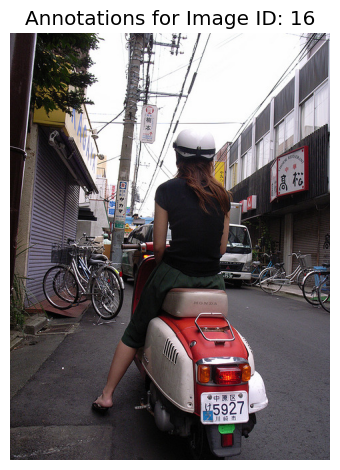

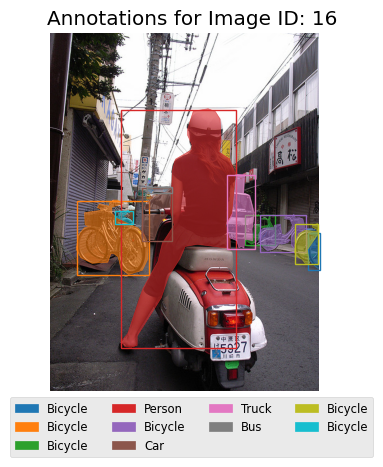

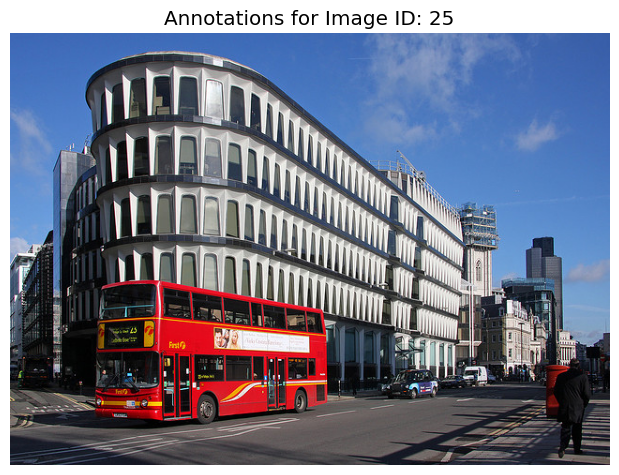

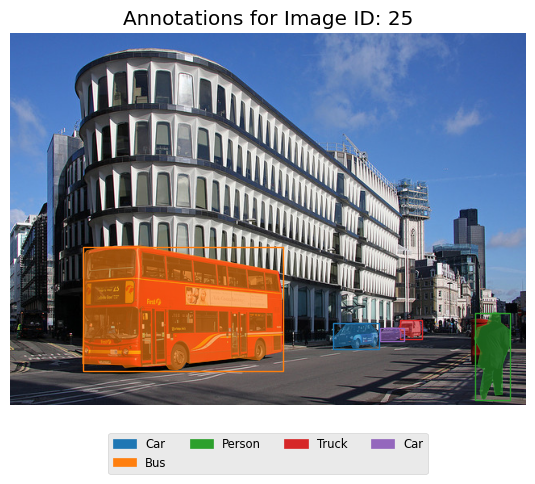

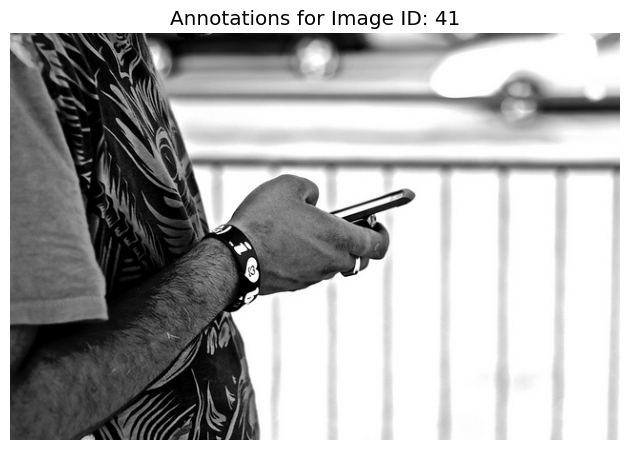

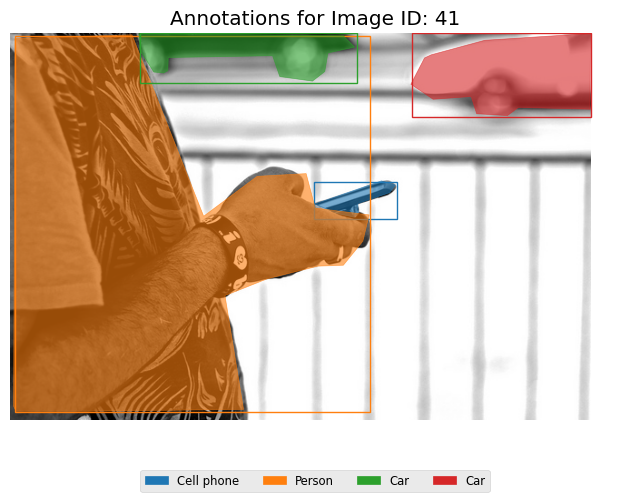

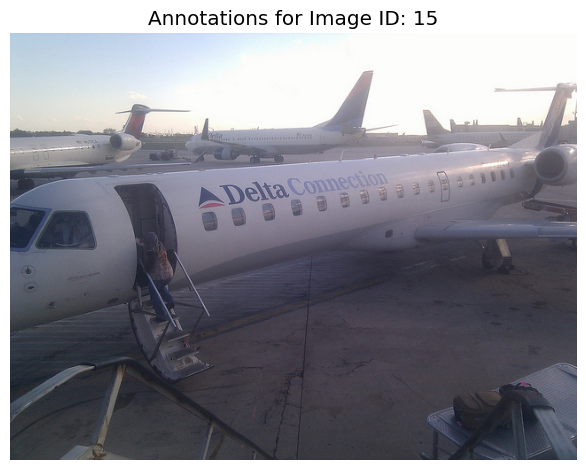

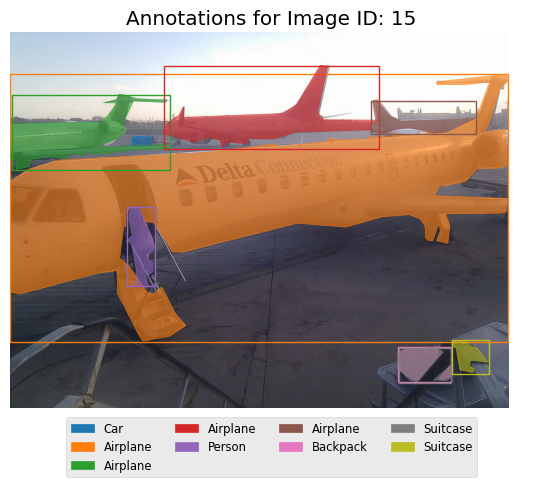

In [ ]:
# Load a random image from the filtered list
if len(imgIds) > 0:
    for image_id in imgIds:
        image_info = coco_train.loadImgs(image_id)

        if image_info is not None and len(image_info) > 0:
            image_info = image_info[0]
            image_path = os.path.join(data_path , image_info['file_name'])

            # Load the annotations for the image
            annotation_ids = coco_train.getAnnIds(imgIds=image_id)
            annotations = coco_train.loadAnns(annotation_ids)

            # Get category names and assign colors for annotations
            category_names = [coco_train.loadCats(ann['category_id'])[0]['name'].capitalize() for ann in annotations]
            category_colors = list(matplotlib.colors.TABLEAU_COLORS.values())

            # Load the image and plot it
            image = plt.imread(image_path)
            plt.imshow(image)
            plt.axis('off')
            plt.title('Annotations for Image ID: {}'.format(image_id))
            plt.tight_layout()
            plt.savefig(f'Img_{image_id}.png', dpi=350)
            plt.show()

            plt.imshow(image)
            plt.axis('off')

            # Display bounding boxes and segmented colors for each annotation
            for ann, color in zip(annotations, category_colors):
                bbox = ann['bbox']
                segmentation = ann['segmentation']

                # Display bounding box
                rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=1,
                                         edgecolor=color, facecolor='none')
                plt.gca().add_patch(rect)

                # Display segmentation masks with assigned colors
                for seg in segmentation:
                    poly = np.array(seg).reshape((len(seg) // 2, 2))
                    plt.fill(poly[:, 0], poly[:, 1], color=color, alpha=0.6)

            # Create a legend with category names and colors
            legend_patches = [patches.Patch(color=color, label=name) for color, name in zip(category_colors, category_names)]
            plt.legend(handles=legend_patches, loc="lower center", ncol=4, bbox_to_anchor=(0.5, -0.2), fontsize='small')

            # Show the image with legend
            plt.title('Annotations for Image ID: {}'.format(image_id))
            plt.tight_layout()
            plt.savefig(f'annImg_{image_id}.png', dpi=350)
            plt.show()
else:
    print("No images found for the desired classes.")

### Generating Masks for Object Segmentation

In [ ]:
image_ids = coco_train.getImgIds()
image_id = image_ids[2]
annotations = coco_train.loadAnns(coco_train.getAnnIds(imgIds=image_id))
annotations

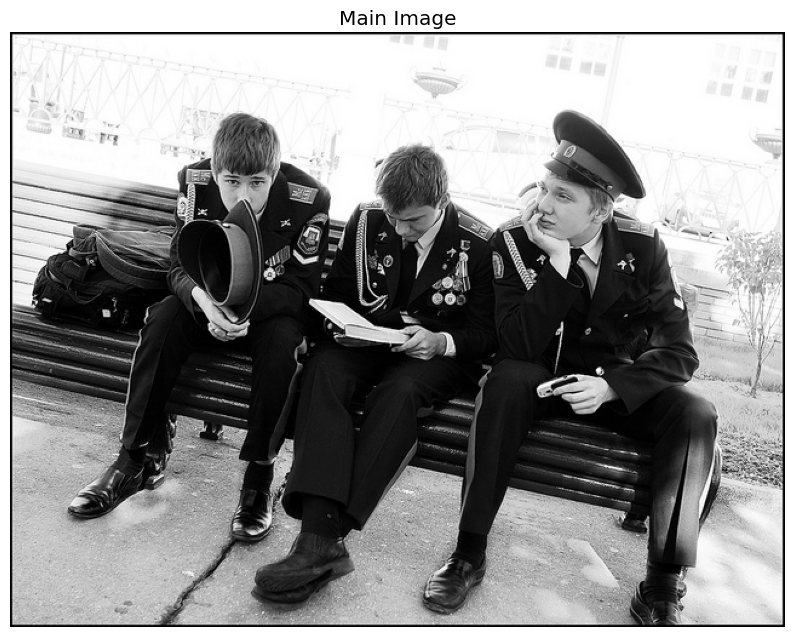

In [ ]:
image_info = coco_train.loadImgs(image_id)[0]
image_path = os.path.join(data_path, image_info['file_name'])

# Load the main image
main_image = plt.imread(image_path)

# Create a new figure for displaying the main image
plt.figure(figsize=(10, 10))
plt.imshow(main_image)
plt.axis('off')
plt.title('Main Image')

# Save the figures
plt.savefig('main_image.png', dpi=300)

# Show the plots
plt.show()

### Generating Binary Masks

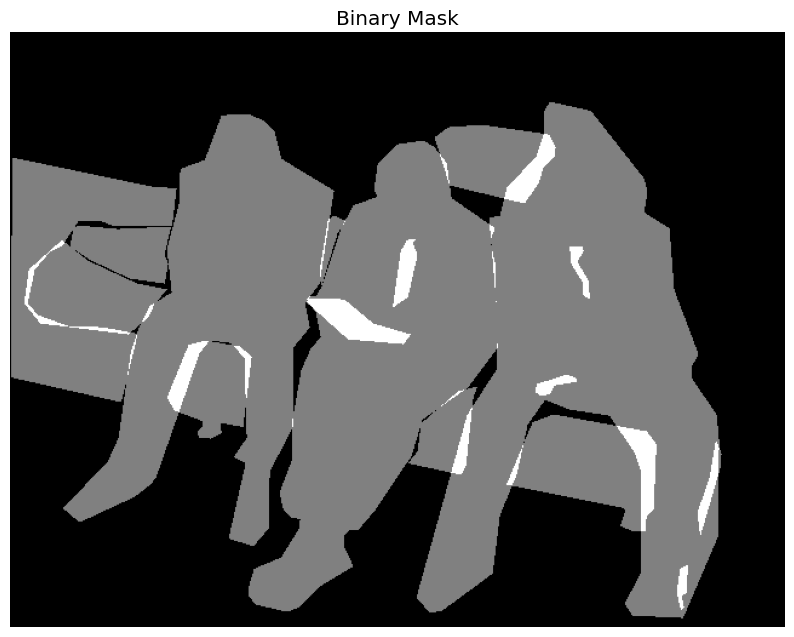

In [ ]:
image_info = coco_train.loadImgs(image_id)[0]
height, width = image_info['height'], image_info['width']

# Create an empty binary mask with the same dimensions as the image
binary_mask = np.zeros((height, width), dtype=np.uint8)

# Iterate through the annotations and draw the binary masks
for annotation in annotations:
    segmentation = annotation['segmentation']
    mask = coco_train.annToMask(annotation)

    # Add the mask to the binary mask
    binary_mask += mask

# Display the binary mask
plt.figure(figsize=(10,10))
plt.imshow(binary_mask, cmap='gray')
plt.axis('off')
plt.title('Binary Mask')
plt.savefig('binary_mask.png', dpi=300)
plt.show()

### Generating RGB Mask

Color Map:
{15: (196, 180, 109), 16: (90, 232, 172), 25: (230, 239, 248), 41: (121, 194, 145)}
Category ID: 19
Category ID 19 not found in color map.
Category ID: 41
Category ID: 41
Category ID: 41
Category ID: 6
Category ID 6 not found in color map.
Category ID: 10
Category ID 10 not found in color map.
Category ID: 16
Category ID: 56
Category ID 56 not found in color map.
Category ID: 56
Category ID 56 not found in color map.
Category ID: 1
Category ID 1 not found in color map.
Category ID: 1
Category ID 1 not found in color map.


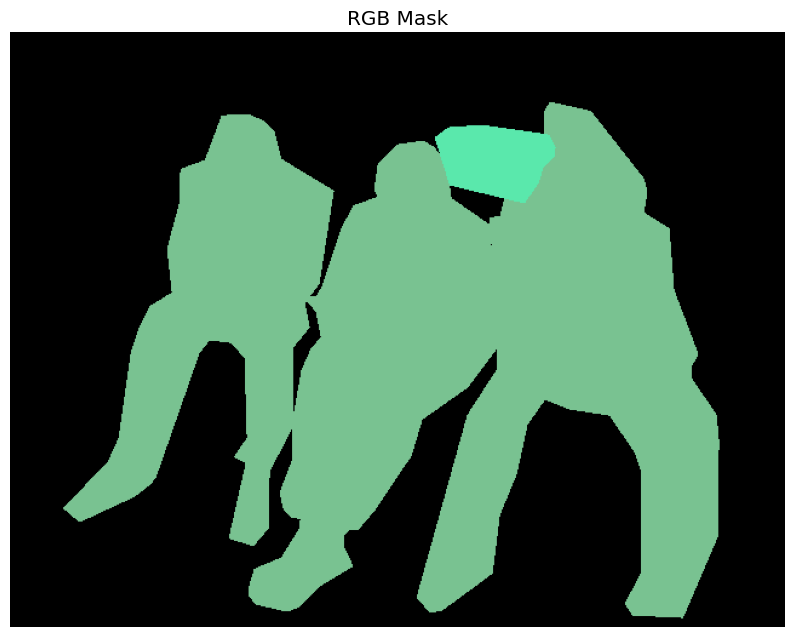

In [ ]:
image_info = coco_train.loadImgs(image_id)[0]
height, width = image_info['height'], image_info['width']

# Create an empty RGB mask with the same dimensions as the image
rgb_mask = np.zeros((height, width, 3), dtype=np.uint8)

# Define a color map for different object classes
color_map = {cat['id']: (np.random.randint(0, 256), np.random.randint(0, 256), np.random.randint(0, 256))
             for cat in coco_train.loadCats(catIDs)}

# Print the color map for debugging
print("Color Map:")
print(color_map)

# Iterate through the annotations and assign unique colors to each class/object
for annotation in annotations:
    category_id = annotation['category_id']

    # Print category IDs for debugging
    print("Category ID:", category_id)

    color = color_map.get(category_id)  # Use .get() to avoid KeyError

    if color is not None:
        # Draw the mask on the RGB mask
        mask = coco_train.annToMask(annotation)
        rgb_mask[mask == 1] = color
    else:
        print("Category ID {} not found in color map.".format(category_id))

# Display the RGB mask
plt.figure(figsize=(10,10))
plt.imshow(rgb_mask)
plt.axis('off')
plt.title('RGB Mask')
plt.savefig('rgb_mask.png', dpi=300)
plt.show()

### Generating Instance Segmentation Mask

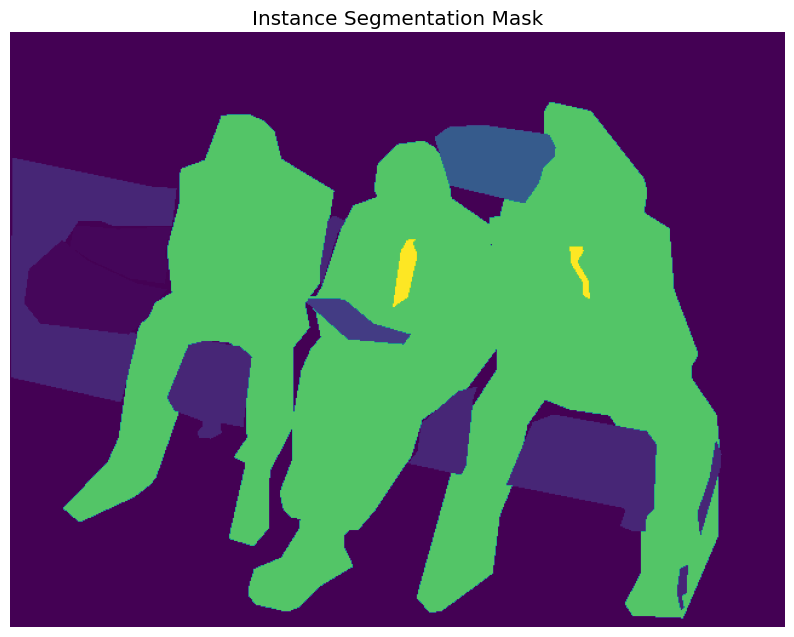

In [ ]:
image_info = coco_train.loadImgs(image_id)[0]
height, width = image_info['height'], image_info['width']

# Create an empty mask with the same dimensions as the image
instance_mask = np.zeros((height, width), dtype=np.uint8)

# Iterate through the annotations and draw the instance segmentation masks
for annotation in annotations:
    segmentation = annotation['segmentation']
    mask = coco_train.annToMask(annotation)
    category_id = annotation['category_id']

    # Assign a unique value to each instance mask
    instance_mask[mask == 1] = category_id

# Display the instance segmentation mask
plt.figure(figsize=(10,10))
plt.imshow(instance_mask, cmap='viridis')
plt.axis('off')
plt.title('Instance Segmentation Mask')
plt.savefig('instance_mask.png', dpi=300)
plt.show()

### Generating Object Detection Bounding Boxes

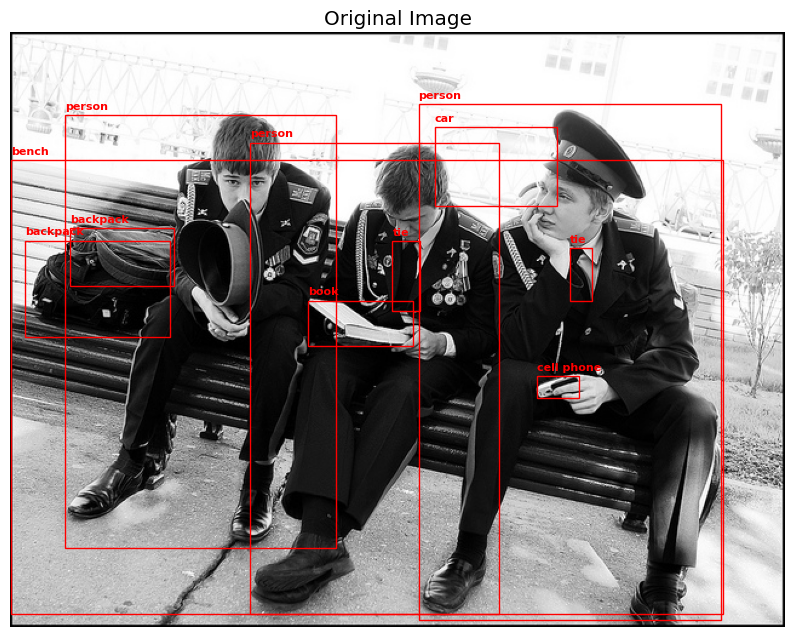

In [ ]:
image_info = coco_train.loadImgs(image_id)[0]
height, width = image_info['height'], image_info['width']

# Create a new figure with the same dimensions as the image
fig, ax = plt.subplots(figsize=(10,10), dpi=100)

# Display the original image
ax.imshow(main_image)
ax.axis('off')
ax.set_title('Original Image')

# Draw bounding boxes on the original image
for annotation in annotations:
    bbox = annotation['bbox']
    category_id = annotation['category_id']
    category_name = coco_train.loadCats(category_id)[0]['name']

    # Convert COCO bounding box format (x, y, width, height) to matplotlib format (xmin, ymin, xmax, ymax)
    xmin, ymin, width, height = bbox
    xmax = xmin + width
    ymax = ymin + height

    # Draw the bounding box rectangle
    rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor='red', facecolor='none')
    ax.add_patch(rect)

    # Add the category name as a label above the bounding box
    ax.text(xmin, ymin - 5, category_name, fontsize=8, color='red', weight='bold')

# Save the figure with adjusted dimensions
plt.savefig('bounding_boxes.png', bbox_inches='tight')

# Show the plot
plt.show()

### Post-Processing Techniques

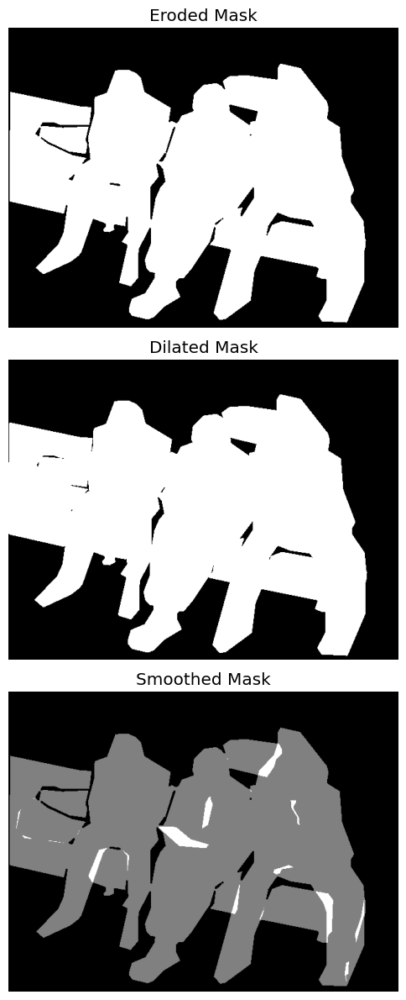

In [ ]:
# Apply erosion to the binary mask
eroded_mask = binary_erosion(binary_mask)

# Apply dilation to the binary mask
dilated_mask = binary_dilation(binary_mask)

# Apply Gaussian blur to the binary mask
smoothed_mask = gaussian_filter(binary_mask, sigma=.2)

# Display the post-processed masks
fig, axes = plt.subplots(3, 1, figsize=(12, 12))

axes[0].imshow(eroded_mask, cmap='gray')
axes[0].set_title('Eroded Mask')
axes[0].axis('off')

axes[1].imshow(dilated_mask, cmap='gray')
axes[1].set_title('Dilated Mask')
axes[1].axis('off')

axes[2].imshow(smoothed_mask, cmap='gray')
axes[2].set_title('Smoothed Mask')
axes[2].axis('off')

plt.tight_layout()
plt.savefig('post_processed_masks.png', dpi=300)
plt.show()

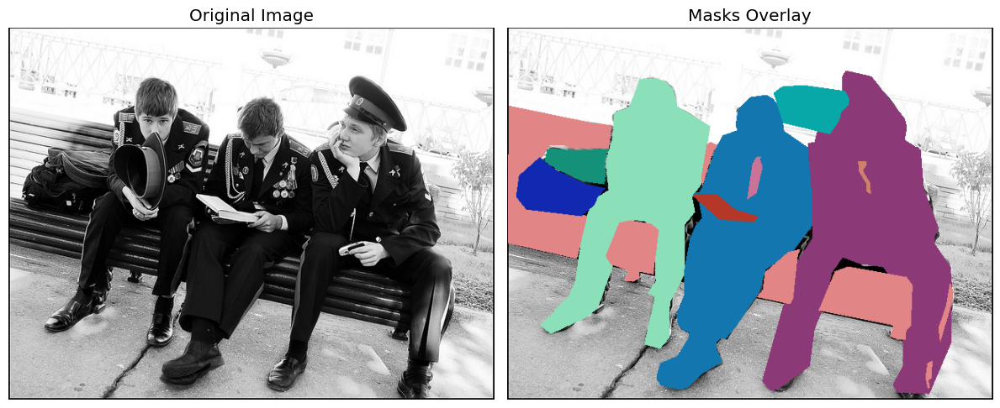

In [ ]:
image_id = image_ids[2]

# Load the image
image_info = coco_train.loadImgs(image_id)[0]
image_path = os.path.join(data_path, image_info['file_name'])
image = plt.imread(image_path)

# Get the ground truth annotations for the image
annotation_ids = coco_train.getAnnIds(imgIds=image_id)
annotations = coco_train.loadAnns(annotation_ids)

# Create a blank image for overlaying the masks
overlay = image.copy()

# Iterate over the annotations and draw the masks on the overlay image
for annotation in annotations:
    # Get the segmentation mask
    mask = coco_train.annToMask(annotation)

    # Choose a random color for the mask
    color = np.random.randint(0, 256, size=(3,), dtype=np.uint8)

    # Apply the mask to the overlay image
    overlay[mask == 1] = color

# Create a figure and subplot for visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Plot the original image
ax1.imshow(image)
ax1.set_title('Original Image')
ax1.axis('off')

# Plot the image with overlay masks
ax2.imshow(overlay)
ax2.set_title('Masks Overlay')
ax2.axis('off')

# Adjust the spacing between subplots
plt.tight_layout()

# Save the visualization as an image file
plt.savefig('mask_visualization.png', dpi=300)

# Show the plot
plt.show()

### Data Generation

In [ ]:
def convert_masks(split, num_classes=-1):
    annotation_file = f'/kaggle/input/rm-segmentation-assignment-dataset/{split}-300/labels.json'
    print(split, end="\n\n")
    coco = COCO(annotation_file)

    # get category ids
    category_ids = coco.getCatIds()
    print("Category IDs: ", category_ids)
    print("Categories: ", [cat["name"] for cat in coco.loadCats(ids=category_ids)])

    # get image ids
    image_ids = coco.getImgIds()
    print(f"Number of images: {len(image_ids)}")

    # Create a directory to store the generated masks
    if split == "train":
        directory_path = '/kaggle/working/train-300/masks'
    else:
        directory_path = '/kaggle/working/validation-300/masks'

    # Create the directory
    os.makedirs(directory_path, exist_ok=True)

    # Mapping categories to pixel values
    if split == "train":
        pixel_map = {15: 1, 16: 2, 25: 3, 41: 4}
    else:
        pixel_map = {14: 1, 15: 2, 24: 3, 41: 4}

    # Generate masks
    for i_img, img_id in enumerate(image_ids):
        img = coco.loadImgs(img_id)[0]
        annotation_ids = coco.getAnnIds(imgIds=img_id, catIds=category_ids, iscrowd=None)
        annotations = coco.loadAnns(annotation_ids)
        mask = np.zeros([img["height"], img["width"]], dtype="uint8")
        for ann in annotations:
            try:
                ann_mask = coco.annToMask(ann)
                category_id = ann["category_id"]
                pixel_value = pixel_map.get(category_id, 0)  # Default value is 0 if category_id not found
                mask[ann_mask > 0] = pixel_value
            except Exception as e:
                print(f"Error processing annotation: {ann}")
                print(f"Error message: {e}")

        file_path = "/kaggle/working/{}-300/masks/{}".format(split, img["file_name"][:-4])
        mask = np.expand_dims(mask, axis=-1)

        if i_img == 0:
            print(np.unique(mask), mask.shape, img["file_name"])

        np.save(file_path, mask)

    print(f"Successfully completed the {split} data.")

In [ ]:
convert_masks("train", 4)

train

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Category IDs:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62]
Categories:  ['airplane', 'backpack', 'banana', 'baseball bat', 'baseball glove', 'bear', 'bench', 'bicycle', 'bird', 'boat', 'book', 'bottle', 'bowl', 'broccoli', 'bus', 'cake', 'car', 'carrot', 'cat', 'cell phone', 'chair', 'clock', 'cow', 'cup', 'dining table', 'dog', 'donut', 'elephant', 'fire hydrant', 'fork', 'frisbee', 'giraffe', 'handbag', 'horse', 'hot dog', 'kite', 'knife', 'laptop', 'motorcycle', 'oven', 'parking meter', 'person', 'pizza', 'potted plant', 'refrigerator', 'remote', 'sandwich', 'scissors', 'skateboard', 'skis', 'spoon', 'sports ball', 'stop sign', 'suitcase', 'surfboard', 'tennis racket', 'tie', 'traffic light', 'train

In [ ]:
convert_masks("validation", 4)

validation

loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
Category IDs:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66]
Categories:  ['airplane', 'apple', 'backpack', 'banana', 'baseball bat', 'baseball glove', 'bench', 'bicycle', 'bird', 'boat', 'book', 'bottle', 'bowl', 'bus', 'cake', 'car', 'carrot', 'cat', 'cell phone', 'chair', 'clock', 'couch', 'cup', 'dining table', 'dog', 'donut', 'elephant', 'fire hydrant', 'fork', 'frisbee', 'giraffe', 'handbag', 'horse', 'hot dog', 'kite', 'knife', 'microwave', 'motorcycle', 'orange', 'oven', 'parking meter', 'person', 'pizza', 'potted plant', 'refrigerator', 'remote', 'sandwich', 'sheep', 'sink', 'skateboard', 'skis', 'snowboard', 'spoon', 'sports ball', 'stop sign', 'suitcase', 'surfboard', 'ten

In [ ]:
import cv2
from PIL import Image

def preprocess_data(images_path, masks_path):
    # Get a list of unique filenames for images and masks
    image_files = set([os.path.splitext(filename)[0] for filename in os.listdir(images_path)])
    mask_files = set([os.path.splitext(filename)[0] for filename in os.listdir(masks_path)])

    # Find the filenames that exist in both sets
    matching_files = list(image_files.intersection(mask_files))

    # Load images and masks for the matching filenames
    images = [Image.open(os.path.join(images_path, f"{filename}.jpg")) for filename in matching_files]
    masks = [np.load(os.path.join(masks_path, f"{filename}.npy")) for filename in matching_files]

    processed_imgs = []
    processed_masks = []

    # Process each image and its corresponding mask
    for i, image_mask in enumerate(zip(images, masks)):
        image, mask = image_mask

        # Resize the image and mask
        image = image.resize((128, 128))
        resized_mask = cv2.resize(mask, (128, 128), interpolation=cv2.INTER_NEAREST)

        # Convert image to numpy array and normalize if it's in the correct shape
        preprocessed_image = np.array(image)
        if len(preprocessed_image.shape) == 3 and preprocessed_image.shape == (128, 128, 3):
            preprocessed_image = preprocessed_image / 255.0
        else:
            print(i, ":", matching_files[i])
            continue

        # Convert mask to numpy array
        preprocessed_mask = np.array(resized_mask, dtype=np.float32)

        processed_imgs.append(preprocessed_image)
        processed_masks.append(preprocessed_mask)

    processed_imgs = np.array(processed_imgs)
    processed_masks = np.array(processed_masks)
    processed_masks = np.expand_dims(processed_masks, axis=3)

    print(processed_imgs.shape, processed_masks.shape)
    return processed_imgs, processed_masks

In [ ]:
images_path = '/kaggle/input/rm-segmentation-assignment-dataset/train-300/data'
masks_path = '/kaggle/working/train-300/masks'

train_images, train_masks = preprocess_data(images_path, masks_path)

139 : 000000000821
210 : 000000005294
(298, 128, 128, 3) (298, 128, 128, 1)


In [ ]:
# Get unique values and their counts from train_masks
unique_values, counts = np.unique(train_masks, return_counts=True)

# Print each unique value and its count
for value, count in zip(unique_values, counts):
    print(f"Unique Value: {value}, Count: {count}")

Unique Value: 0.0, Count: 4268621
Unique Value: 1.0, Count: 1284
Unique Value: 2.0, Count: 222816
Unique Value: 3.0, Count: 8432
Unique Value: 4.0, Count: 381279


In [ ]:
# Validation data paths
val_image_directory = "/kaggle/input/rm-segmentation-assignment-dataset/validation-300/data"
val_mask_directory = "/kaggle/working/validation-300/masks"

# Load validation images and masks
val_images, val_masks = preprocess_data(val_image_directory, val_mask_directory)

19 : 000000209222
(299, 128, 128, 3) (299, 128, 128, 1)


In [ ]:
# Get unique values and their counts from val_masks
unique_values, counts = np.unique(val_masks, return_counts=True)

# Print each unique value and its count
for value, count in zip(unique_values, counts):
    print(f"Unique Value: {value}, Count: {count}")

Unique Value: 0.0, Count: 4237635
Unique Value: 1.0, Count: 10088
Unique Value: 2.0, Count: 237385
Unique Value: 3.0, Count: 4522
Unique Value: 4.0, Count: 409186


In [ ]:
# Importing necessary function for one-hot encoding
from tensorflow.keras.utils import to_categorical

# One-hot encode the training masks
train_masks_encoded = to_categorical(train_masks, num_classes=5)
print("Shape of one-hot encoded training masks:", train_masks_encoded.shape)
print("Unique values in one-hot encoded training masks:", np.unique(train_masks_encoded))

# One-hot encode the validation masks
val_masks_encoded = to_categorical(val_masks, num_classes=5)
print("Shape of one-hot encoded validation masks:", val_masks_encoded.shape)
print("Unique values in one-hot encoded validation masks:", np.unique(val_masks_encoded))

Shape of one-hot encoded training masks: (298, 128, 128, 5)
Unique values in one-hot encoded training masks: [0. 1.]
Shape of one-hot encoded validation masks: (299, 128, 128, 5)
Unique values in one-hot encoded validation masks: [0. 1.]


### Displaying Processed Images and Masks
Displays the initial 10 images along with their corresponding masks in the training dataset.

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


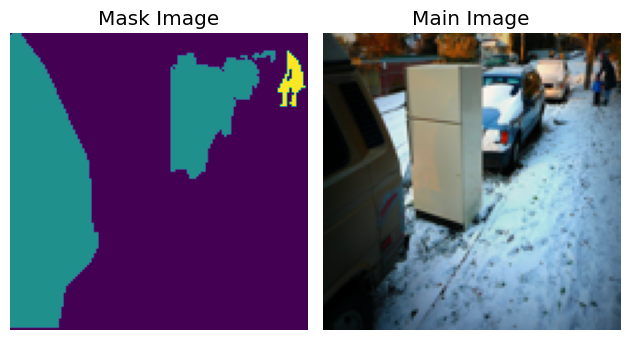

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


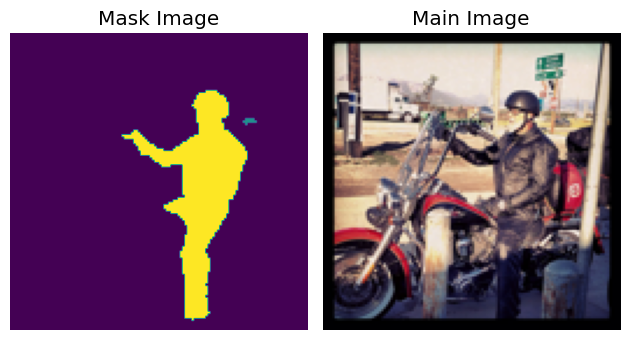

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


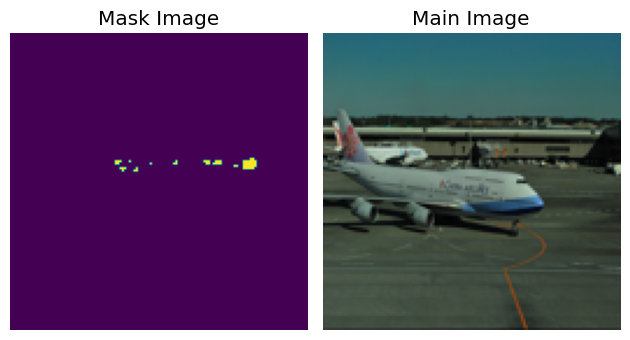

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


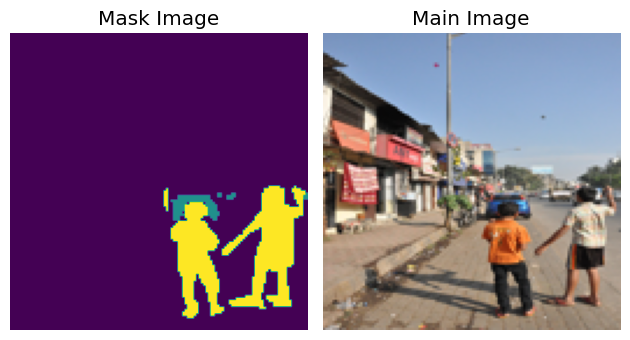

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


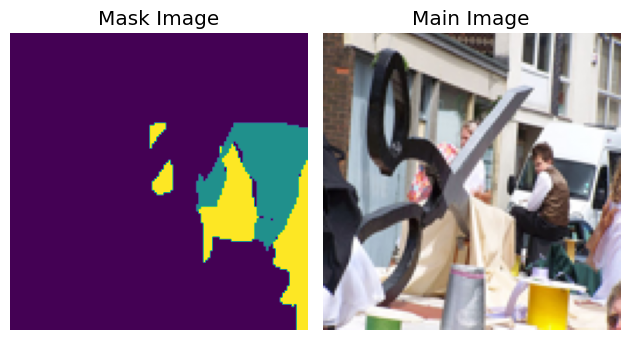

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


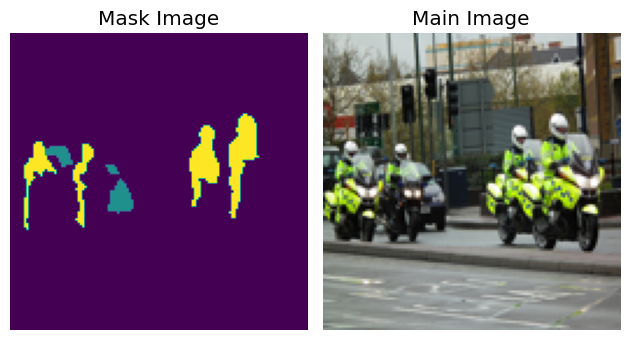

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


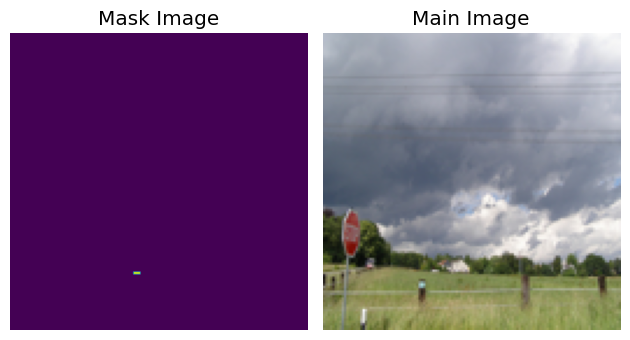

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


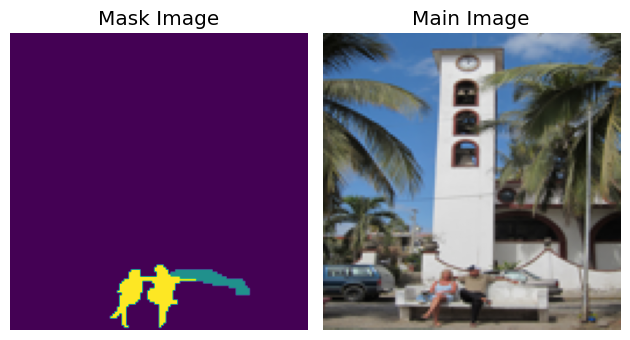

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


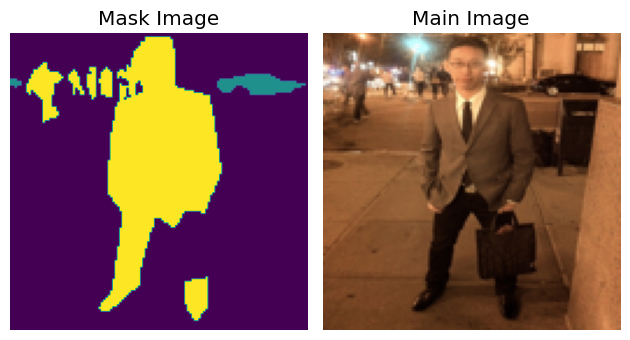

Mask Image Shape: (128, 128, 1)
Main Image Shape: (128, 128, 3)


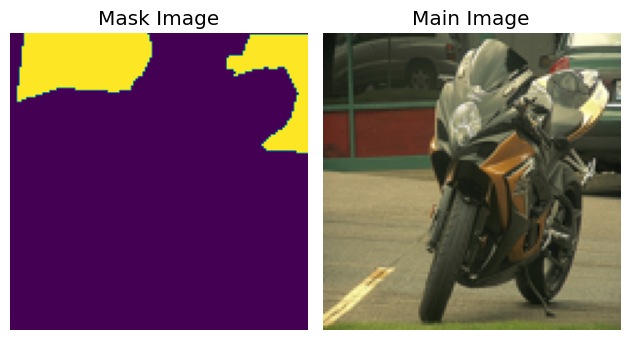

In [ ]:
# Iterate over the first 10 images
for i in range(10):
    # Load and display the mask image
    mask_img = train_masks[i]
    plt.subplot(1, 2, 1)
    plt.imshow(mask_img)
    plt.title('Mask Image')
    plt.axis('off')

    # Load and display the corresponding main image
    main_img = train_images[i]
    plt.subplot(1, 2, 2)
    plt.imshow(main_img)
    plt.title('Main Image')
    plt.axis('off')

    # Print the shapes of the images
    print('Mask Image Shape:', np.array(mask_img).shape)
    print('Main Image Shape:', np.array(main_img).shape)

    plt.tight_layout()
    plt.show()

In [ ]:
# Extracting data for visualization
image_data = train_images[7]
one_hot_encoded_mask = train_masks_encoded[7]
normal_mask = train_masks[7]

# Printing shapes of the extracted data
print('Image Shape:', image_data.shape)
print('One-hot Encoded Mask Shape:', one_hot_encoded_mask.shape)
print('Normal Mask Shape:', normal_mask.shape)

Image Shape: (128, 128, 3)
One-hot Encoded Mask Shape: (128, 128, 5)
Normal Mask Shape: (128, 128, 1)


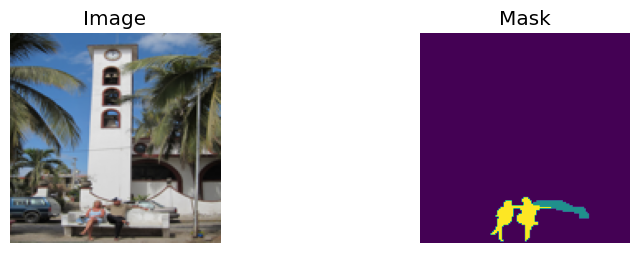

In [ ]:
# Visualizing the image and mask
plt.figure(figsize=(15, 6))

plt.subplot(2, 3, 1)
plt.title('Image')
plt.imshow(image_data)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('Mask')
plt.imshow(normal_mask)
plt.axis('off')

# Displaying the visualization
plt.show()

## Building Unet Model

In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, concatenate, BatchNormalization, Activation, MaxPool2D, Concatenate
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
import keras.backend as K
import tensorflow as tf

def dice_metric(y_true, y_pred, smooth=1):
    y_true = tf.reshape(y_true, (-1,))
    y_pred = tf.reshape(y_pred, (-1,))
    intersection = tf.reduce_sum(y_true * y_pred)
    dice = (2.0 * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)
    return dice

def dice_loss(y_true, y_pred):
    return 1 - dice_metric(y_true, y_pred)

def iou_score(y_true, y_pred, smooth=1e-4):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# Convolutional block
def conv_block(input, num_filters, dropout_rate):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Dropout(dropout_rate)(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

# Encoder block
def encoder_block(input, num_filters, dropout_rate):
    x = conv_block(input, num_filters, dropout_rate)
    p = MaxPool2D((2, 2))(x)
    return x, p

# Decoder block
def decoder_block(input, skip_features, num_filters, dropout_rate):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters, dropout_rate)
    return x

# Building U-Net architecture
def build_unet(input_shape, n_classes, dropout_rate):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64, dropout_rate)
    s2, p2 = encoder_block(p1, 128, dropout_rate)
    s3, p3 = encoder_block(p2, 256, dropout_rate)
    s4, p4 = encoder_block(p3, 512, dropout_rate)

    b1 = conv_block(p4, 1024, dropout_rate) # Bridge

    d1 = decoder_block(b1, s4, 512, dropout_rate)
    d2 = decoder_block(d1, s3, 256, dropout_rate)
    d3 = decoder_block(d2, s2, 128, dropout_rate)
    d4 = decoder_block(d3, s1, 64, dropout_rate)

    if n_classes == 1:  # Binary
      activation = 'sigmoid'
    else:
      activation = 'softmax'

    outputs = Conv2D(n_classes, 1, padding="same", activation=activation)(d4)
    print(activation)

    model = Model(inputs, outputs, name="U-Net")
    return model

# Define input shape, number of classes, and dropout rate
input_shape = (128, 128, 3)
num_classes = 5
dropout_rate = 0.3

# Build U-Net model
model = build_unet(input_shape, num_classes, dropout_rate)
model.summary()

softmax


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 128, 128,  │          0 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     36,928 │ dropout[0][0]     │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 64, 64,    │          0 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    147,584 │ dropout_1[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ activation_3[0][

 Total params: 31,055,557 (118.47 MB)

 Trainable params: 31,043,781 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
# Define callbacks
callbacks = [
    ModelCheckpoint(filepath="unet1.keras", monitor="val_loss", verbose=1, save_best_only=True),
    EarlyStopping(patience=5, restore_best_weights=True)
]

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=[iou_score, dice_metric]
)

In [ ]:
# Training the model
history = model.fit(
    train_images, train_masks_encoded,
    batch_size=8,
    verbose=1,
    epochs=50,
    validation_data=(val_images, val_masks_encoded),
    callbacks=callbacks
)

Epoch 1/50


2024-04-22 10:10:05.538959: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.03096, expected 3.38235
2024-04-22 10:10:05.539017: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 5.32994, expected 4.68133
2024-04-22 10:10:05.539026: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.98183, expected 4.33322
2024-04-22 10:10:05.539033: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 4.58993, expected 3.94132
2024-04-22 10:10:05.539041: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 4.88448, expected 4.23587
2024-04-22 10:10:05.539048: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 4.0543, expected 3.40569
2024-04-22 10:10:05.539056: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 3.81349, expected 3.16489
2024-04-22 10:10:05.539063: E external/local_xla/xla/ser

 2/38 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step - dice_metric: 0.2189 - iou_score: 0.1229 - loss: 1.7435  

I0000 00:00:1713780627.927735     105 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - dice_metric: 0.2393 - iou_score: 0.1362 - loss: 1.6295

2024-04-22 10:10:38.705780: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.56543, expected 3.80355
2024-04-22 10:10:38.705835: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.4627, expected 5.70082
2024-04-22 10:10:38.705844: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.3492, expected 4.58732
2024-04-22 10:10:38.705851: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.43624, expected 4.67436
2024-04-22 10:10:38.705859: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 4.93471, expected 4.17284
2024-04-22 10:10:38.705866: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 4.75493, expected 3.99306
2024-04-22 10:10:38.705874: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 4.27207, expected 3.51019
2024-04-22 10:10:38.705881: E external/local_xla/xla/serv

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 726ms/step - dice_metric: 0.2402 - iou_score: 0.1367 - loss: 1.6255

2024-04-22 10:10:58.255006: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16392: 3.5872, expected 3.08209
2024-04-22 10:10:58.255060: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16442: 3.93848, expected 3.43337
2024-04-22 10:10:58.255069: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 16464: 3.24766, expected 2.74255
2024-04-22 10:10:58.255119: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 25856: 3.98649, expected 3.48138
2024-04-22 10:10:58.255128: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 26240: 4.04367, expected 3.53857
2024-04-22 10:10:58.255137: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 26533: 4.03924, expected 3.53413
2024-04-22 10:10:58.255163: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 28544: 3.11223, expected 2.60713
2024-04-22 10:10:58.255172: 


Epoch 1: val_loss improved from inf to 1.38513, saving model to unet1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 78s 933ms/step - dice_metric: 0.2410 - iou_score: 0.1373 - loss: 1.6217 - val_dice_metric: 0.2529 - val_iou_score: 0.1448 - val_loss: 1.3851
Epoch 2/50
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - dice_metric: 0.3979 - iou_score: 0.2493 - loss: 1.0439
Epoch 2: val_loss improved from 1.38513 to 0.98897, saving model to unet1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 140ms/step - dice_metric: 0.4003 - iou_score: 0.2513 - loss: 1.0384 - val_dice_metric: 0.3994 - val_iou_score: 0.2497 - val_loss: 0.9890
Epoch 3/50
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - dice_metric: 0.5541 - iou_score: 0.3838 - loss: 0.7147
Epoch 3: val_loss improved from 0.98897 to 0.78421, saving model to unet1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 5s 138ms/step - dice_metric: 0.5546 - iou_score: 0.3842 - loss: 0.7148 - val_dice_metric: 0.5251 - val_iou_score: 0.3566 - val_loss: 0.7842
Epoch 4/50
37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms

In [ ]:
# Get the dice metric values from history
best_dice = history.history["dice_metric"][17]
best_val_dice = history.history["val_dice_metric"][17]

# Print the information
print("The last model saved by ModelCheckpoint was at Epoch 18 with a dice metric of {:.4f} and a validation dice metric of {:.4f}".format(best_dice, best_val_dice))

The last model saved by ModelCheckpoint was at Epoch 18 with a dice metric of 0.7595 and a validation dice metric of 0.7880


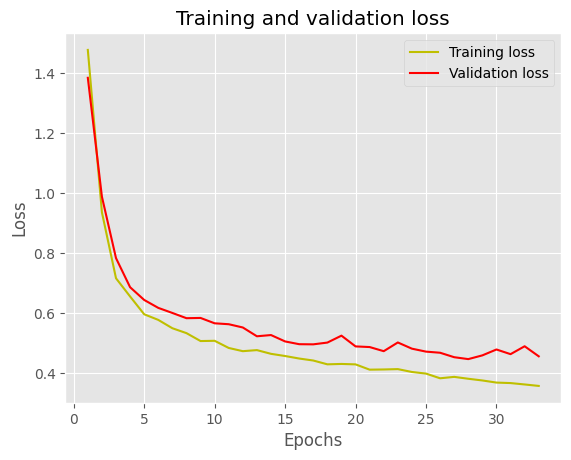

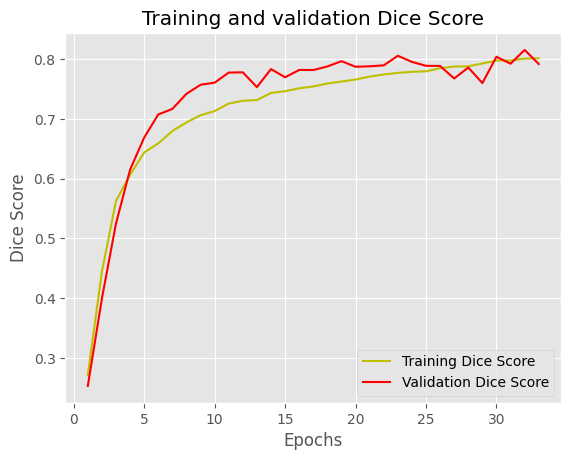

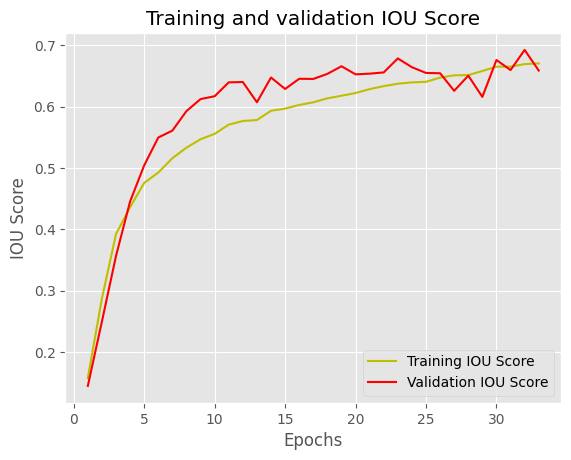

In [ ]:
# Plotting training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)

plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting training and validation dice score
dice = history.history['dice_metric']
val_dice = history.history['val_dice_metric']

plt.plot(epochs, dice, 'y', label='Training Dice Score')
plt.plot(epochs, val_dice, 'r', label='Validation Dice Score')
plt.title('Training and validation Dice Score')
plt.xlabel('Epochs')
plt.ylabel('Dice Score')
plt.legend()
plt.show()

# Plotting training and validation IOU score
IOU = history.history['iou_score']
val_IOU = history.history['val_iou_score']

plt.plot(epochs, IOU, 'y', label='Training IOU Score')
plt.plot(epochs, val_IOU, 'r', label='Validation IOU Score')
plt.title('Training and validation IOU Score')
plt.xlabel('Epochs')
plt.ylabel('IOU Score')
plt.legend()
plt.show()

In [ ]:
from keras.models import load_model
loaded_model = load_model("/kaggle/working/unet1.keras", compile=False)

In [ ]:
# Predicting masks for validation images
predictions = model.predict(val_images)

# Printing the shape of the prediction array
print("Shape of the predicted masks:", predictions.shape)

2024-04-22 10:13:39.288768: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.34782, expected 3.51669
2024-04-22 10:13:39.288827: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 6.71977, expected 5.88864
2024-04-22 10:13:39.288836: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 6.95696, expected 6.12583
2024-04-22 10:13:39.288844: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.48105, expected 5.64992
2024-04-22 10:13:39.288851: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.32797, expected 4.49684
2024-04-22 10:13:39.288859: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.7497, expected 4.91857
2024-04-22 10:13:39.288866: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.01592, expected 5.18479
2024-04-22 10:13:39.288874: E external/local_xla/xla/ser

 9/10 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

2024-04-22 10:13:53.177913: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.00794, expected 2.39882
2024-04-22 10:13:53.177969: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.76034, expected 4.15122
2024-04-22 10:13:53.177978: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.63933, expected 4.03021
2024-04-22 10:13:53.177986: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.08604, expected 3.47692
2024-04-22 10:13:53.177994: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 3.80353, expected 3.19441
2024-04-22 10:13:53.178001: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 3.49817, expected 2.88905
2024-04-22 10:13:53.178009: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 3.10099, expected 2.49187
2024-04-22 10:13:53.178016: E external/local_xla/xla/se

10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 702ms/step
Shape of the predicted masks: (299, 128, 128, 5)


In [ ]:
# Compute the argmax along the last axis of the predicted masks
y_pred_argmax = predictions.argmax(axis=-1)

# Print the shape and unique values of the resulting array
print("Shape of the predicted masks after argmax:", y_pred_argmax.shape)
print("Unique values in the predicted masks after argmax:", np.unique(y_pred_argmax))

Shape of the predicted masks after argmax: (299, 128, 128)
Unique values in the predicted masks after argmax: [0 4]


In [ ]:
# Using built-in Keras function to compute Mean IoU
from keras.metrics import MeanIoU

# Define the number of classes
num_classes = 5

# Initialize MeanIoU object
iou_keras = MeanIoU(num_classes=num_classes)

# Update the state with ground truth masks and predicted masks
iou_keras.update_state(val_masks[:, :, :, 0], y_pred_argmax)

# Print the computed Mean IoU
print("Mean IoU =", iou_keras.result().numpy())

Mean IoU = 0.20192584


Test Image Number: 161


2024-04-22 10:13:59.941441: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32768: 3.66788, expected 2.82077
2024-04-22 10:13:59.941490: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32769: 5.27059, expected 4.42348
2024-04-22 10:13:59.941509: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32770: 5.00058, expected 4.15347
2024-04-22 10:13:59.941523: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32771: 4.72297, expected 3.87586
2024-04-22 10:13:59.941535: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32772: 4.5861, expected 3.73899
2024-04-22 10:13:59.941546: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32773: 4.17555, expected 3.32844
2024-04-22 10:13:59.941556: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32774: 3.43326, expected 2.58615
2024-04-22 10:13:59.941567: 

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Image Shape: (128, 128, 3)
Ground Truth Mask Shape: (128, 128, 1)
Predicted Mask Shape: (128, 128, 1)


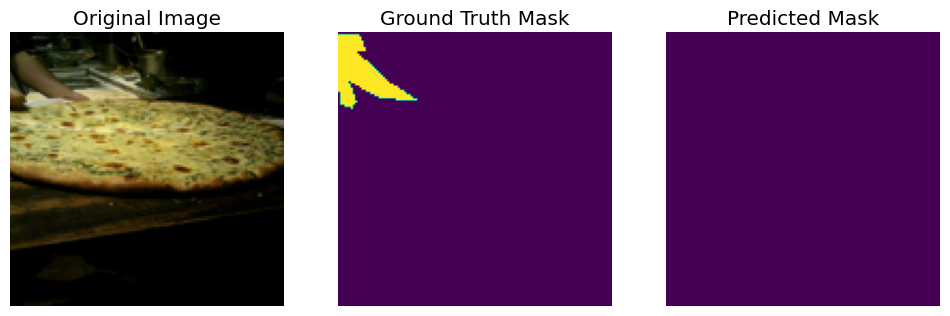

In [ ]:
import random

# Randomly select an image from the validation set
test_img_number = random.randint(0, len(val_images)-1)
print("Test Image Number:", test_img_number)

# Extract the selected image, its ground truth mask, and prepare it for prediction
test_img = val_images[test_img_number]
ground_truth = val_masks[test_img_number]
test_img_input = np.expand_dims(test_img, 0)

# Predict the mask for the selected image
prediction = model.predict(test_img_input)[0]
pred = np.expand_dims(prediction.argmax(axis=-1), axis=-1)

# Print shapes of the selected image, ground truth mask, and predicted mask
print("Image Shape:", test_img.shape)
print("Ground Truth Mask Shape:", ground_truth.shape)
print("Predicted Mask Shape:", pred.shape)

# Plot the original image, ground truth mask, and predicted mask
plt.figure(figsize=(12, 8))

# Original image
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(test_img)
plt.axis('off')

# Ground truth mask
plt.subplot(1, 3, 2)
plt.title('Ground Truth Mask')
plt.imshow(ground_truth)
plt.axis('off')

# Predicted mask
plt.subplot(1, 3, 3)
plt.title('Predicted Mask')
plt.imshow(pred)
plt.axis('off')

plt.show()

In [ ]:
import random

def return_test_images(images_path):
    # Get the list of image filenames from the specified directory
    image_filenames = [filename for filename in os.listdir(images_path)]
    # Randomly select 4 image filenames
    test_image_filenames = random.choices(image_filenames, k=4)

    # Load and preprocess the selected test images
    test_images = [Image.open(os.path.join(images_path, filename)).resize((128, 128)) for filename in test_image_filenames]
    processed_test_images = []

    # Process each test image
    for image in test_images:
        preprocessed_image = np.array(image)
        # Normalize the image if it meets the required shape
        if len(preprocessed_image.shape) == 3 and preprocessed_image.shape == (128, 128, 3):
            preprocessed_image = preprocessed_image / 255.0
        else:
            print("Invalid image shape:", preprocessed_image.shape)
            continue
        processed_test_images.append(preprocessed_image)

    processed_test_images = np.array(processed_test_images)

    print("Processed Test Images Shape:", processed_test_images.shape)
    return processed_test_images

# Path to the directory containing test images
test_images_path = '/kaggle/input/rm-segmentation-assignment-dataset/test-30'
test_images = return_test_images(test_images_path)

Processed Test Images Shape: (4, 128, 128, 3)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Image Shape: (128, 128, 3)
Predicted Mask Shape: (128, 128, 1)


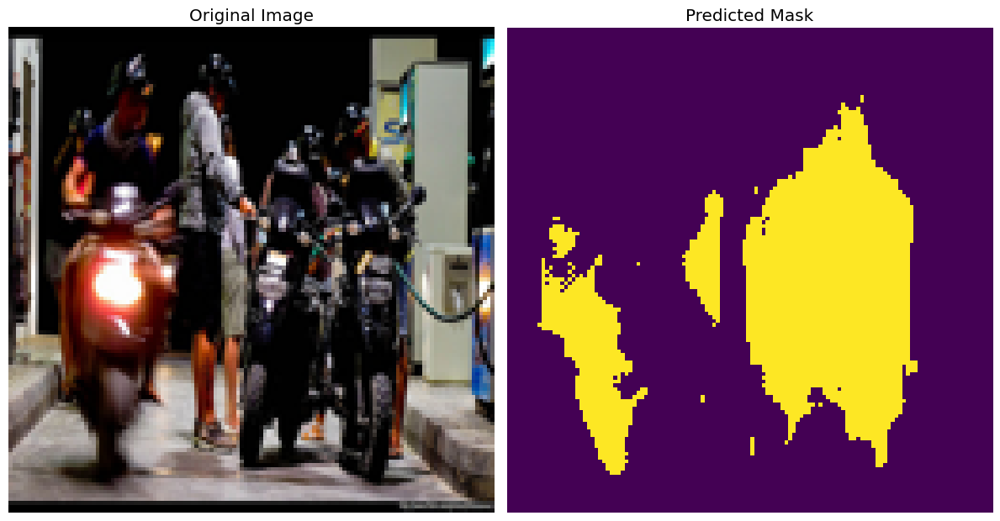

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Image Shape: (128, 128, 3)
Predicted Mask Shape: (128, 128, 1)


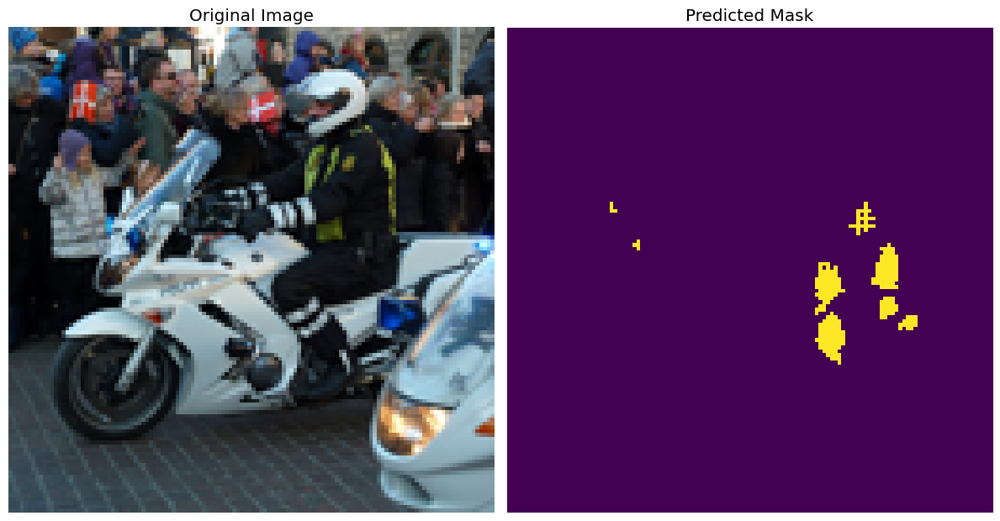

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Image Shape: (128, 128, 3)
Predicted Mask Shape: (128, 128, 1)


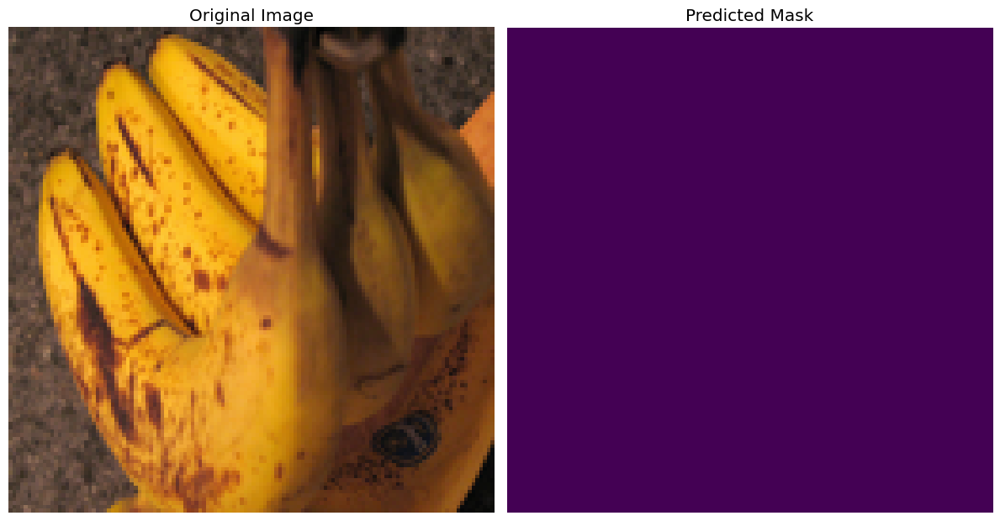

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Image Shape: (128, 128, 3)
Predicted Mask Shape: (128, 128, 1)


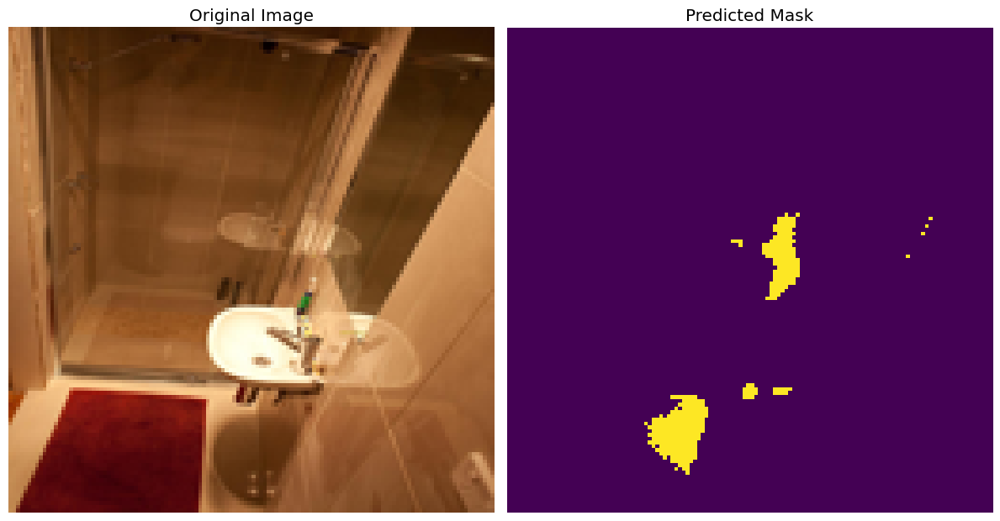

In [ ]:
for i, image in enumerate(test_images):
    # Expand the dimensions to make it suitable for model prediction
    image_input = np.expand_dims(image, 0)

    # Get the prediction from the model
    prediction = model.predict(image_input)[0]
    # Convert prediction to a binary mask
    predicted_mask = np.expand_dims(prediction.argmax(axis=-1), axis=-1)

    # Print the shapes of the original image and the predicted mask
    print("Original Image Shape:", image.shape)
    print("Predicted Mask Shape:", predicted_mask.shape)

    # Plotting
    plt.figure(figsize=(12, 8))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(image)
    plt.axis('off')

    # Plot the predicted mask
    plt.subplot(1, 2, 2)
    plt.title('Predicted Mask')
    plt.imshow(predicted_mask)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
import cv2
from PIL import Image

def preprocess_data(images_path, masks_path):
    # Get a list of unique filenames for images and masks
    image_files = set([os.path.splitext(filename)[0] for filename in os.listdir(images_path)])
    mask_files = set([os.path.splitext(filename)[0] for filename in os.listdir(masks_path)])

    # Find the filenames that exist in both sets
    matching_files = list(image_files.intersection(mask_files))

    # Load images and masks for the matching filenames
    images = [Image.open(os.path.join(images_path, f"{filename}.jpg")) for filename in matching_files]
    masks = [np.load(os.path.join(masks_path, f"{filename}.npy")) for filename in matching_files]

    processed_imgs = []
    processed_masks = []

    # Process each image and its corresponding mask
    for i, image_mask in enumerate(zip(images, masks)):
        image, mask = image_mask

        # Resize the image and mask
        image = image.resize((224, 224))
        resized_mask = cv2.resize(mask, (224, 224), interpolation=cv2.INTER_NEAREST)

        # Convert image to numpy array and normalize if it's in the correct shape
        preprocessed_image = np.array(image)
        if len(preprocessed_image.shape) == 3 and preprocessed_image.shape == (224, 224, 3):
            preprocessed_image = preprocessed_image / 255.0
        else:
            print(i, ":", matching_files[i])
            continue

        # Convert mask to numpy array
        preprocessed_mask = np.array(resized_mask, dtype=np.float32)

        processed_imgs.append(preprocessed_image)
        processed_masks.append(preprocessed_mask)

    processed_imgs = np.array(processed_imgs)
    processed_masks = np.array(processed_masks)
    processed_masks = np.expand_dims(processed_masks, axis=3)

    print(processed_imgs.shape, processed_masks.shape)
    return processed_imgs, processed_masks

In [ ]:
images_path = '/kaggle/input/rm-segmentation-assignment-dataset/train-300/data'
masks_path = '/kaggle/working/train-300/masks'

train_images, train_masks = preprocess_data(images_path, masks_path)

139 : 000000000821
210 : 000000005294
(298, 224, 224, 3) (298, 224, 224, 1)


In [ ]:
# Validation data paths
val_image_directory = "/kaggle/input/rm-segmentation-assignment-dataset/validation-300/data"
val_mask_directory = "/kaggle/working/validation-300/masks"

# Load validation images and masks
val_images, val_masks = preprocess_data(val_image_directory, val_mask_directory)

19 : 000000209222
(299, 224, 224, 3) (299, 224, 224, 1)


In [ ]:
# Importing necessary function for one-hot encoding
from tensorflow.keras.utils import to_categorical

# One-hot encode the training masks
train_masks_encoded = to_categorical(train_masks, num_classes=5)
print("Shape of one-hot encoded training masks:", train_masks_encoded.shape)
print("Unique values in one-hot encoded training masks:", np.unique(train_masks_encoded))

# One-hot encode the validation masks
val_masks_encoded = to_categorical(val_masks, num_classes=5)
print("Shape of one-hot encoded validation masks:", val_masks_encoded.shape)
print("Unique values in one-hot encoded validation masks:", np.unique(val_masks_encoded))

Shape of one-hot encoded training masks: (298, 224, 224, 5)
Unique values in one-hot encoded training masks: [0. 1.]
Shape of one-hot encoded validation masks: (299, 224, 224, 5)
Unique values in one-hot encoded validation masks: [0. 1.]


In [ ]:
# Extracting data for visualization
image_data = train_images[7]
one_hot_encoded_mask = train_masks_encoded[7]
normal_mask = train_masks[7]

# Printing shapes of the extracted data
print('Image Shape:', image_data.shape)
print('One-hot Encoded Mask Shape:', one_hot_encoded_mask.shape)
print('Normal Mask Shape:', normal_mask.shape)

Image Shape: (224, 224, 3)
One-hot Encoded Mask Shape: (224, 224, 5)
Normal Mask Shape: (224, 224, 1)


In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, concatenate, BatchNormalization, Activation, MaxPool2D, Concatenate
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping
import keras.backend as K
import tensorflow as tf

def dice_metric(y_true, y_pred, smooth=1):
    y_true = tf.reshape(y_true, (-1,))
    y_pred = tf.reshape(y_pred, (-1,))
    intersection = tf.reduce_sum(y_true * y_pred)
    dice = (2.0 * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)
    return dice

def dice_loss(y_true, y_pred):
    return 1 - dice_metric(y_true, y_pred)

def iou_score(y_true, y_pred, smooth=1e-4):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return (intersection + smooth) / (union + smooth)

# Convolutional block
def conv_block(input, num_filters, dropout_rate):
    x = Conv2D(num_filters, 3, padding="same")(input)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)
    x = Dropout(dropout_rate)(x)

    x = Conv2D(num_filters, 3, padding="same")(x)
    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    return x

# Encoder block
def encoder_block(input, num_filters, dropout_rate):
    x = conv_block(input, num_filters, dropout_rate)
    p = MaxPool2D((2, 2))(x)
    return x, p

# Decoder block
def decoder_block(input, skip_features, num_filters, dropout_rate):
    x = Conv2DTranspose(num_filters, (2, 2), strides=2, padding="same")(input)
    x = Concatenate()([x, skip_features])
    x = conv_block(x, num_filters, dropout_rate)
    return x

# Building U-Net architecture
def build_unet(input_shape, n_classes, dropout_rate):
    inputs = Input(input_shape)

    s1, p1 = encoder_block(inputs, 64, dropout_rate)
    s2, p2 = encoder_block(p1, 128, dropout_rate)
    s3, p3 = encoder_block(p2, 256, dropout_rate)
    s4, p4 = encoder_block(p3, 512, dropout_rate)

    b1 = conv_block(p4, 1024, dropout_rate) # Bridge

    d1 = decoder_block(b1, s4, 512, dropout_rate)
    d2 = decoder_block(d1, s3, 256, dropout_rate)
    d3 = decoder_block(d2, s2, 128, dropout_rate)
    d4 = decoder_block(d3, s1, 64, dropout_rate)

    if n_classes == 1:  # Binary
        activation = 'sigmoid'
    else:
        activation = 'softmax'

    outputs = Conv2D(n_classes, 1, padding="same", activation=activation)(d4)
    print(activation)

    model = Model(inputs, outputs, name="U-Net")
    return model

# Define input shape, number of classes, and dropout rate
input_shape = (224, 224, 3)
num_classes = 5
dropout_rate = 0.3

# Build U-Net model
model = build_unet(input_shape, num_classes, dropout_rate)
model.summary()

softmax


Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 224, 224,  │      1,792 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 224, 224,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 224, 224,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 224, 224,  │          0 │ activation_18[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 224, 224,  │     36,928 │ dropout_9[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 224, 224,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 224, 224,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 112, 112,  │          0 │ activation_19[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 112, 112,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_20       │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_10          │ (None, 112, 112,  │          0 │ activation_20[0]… │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 112, 112,  │    147,584 │ dropout_10[0][0]  │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 112, 112,  │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_21       │ (None, 112, 112,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 56, 56,    │          0 │ activation_21[0]

 Total params: 31,055,557 (118.47 MB)

 Trainable params: 31,043,781 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
# Define callbacks
callbacks = [
    ModelCheckpoint(filepath="unet1.keras", monitor="val_loss", verbose=1, save_best_only=True),
    EarlyStopping(patience=5, restore_best_weights=True)
]

# Compile the model
model.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=[iou_score, dice_metric]
)

In [ ]:
# Training the model
history = model.fit(
    train_images, train_masks_encoded,
    batch_size=8,
    verbose=1,
    epochs=50,
    validation_data=(val_images, val_masks_encoded),
    callbacks=callbacks
)

Epoch 1/50


2024-04-22 10:14:43.605932: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50176: 4.39009, expected 3.53025
2024-04-22 10:14:43.605994: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50177: 5.40727, expected 4.54742
2024-04-22 10:14:43.606004: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50178: 5.56026, expected 4.70042
2024-04-22 10:14:43.606012: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50179: 5.58812, expected 4.72827
2024-04-22 10:14:43.606019: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50180: 4.9643, expected 4.10445
2024-04-22 10:14:43.606044: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50181: 5.19898, expected 4.33914
2024-04-22 10:14:43.606052: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50182: 5.47066, expected 4.61082
2024-04-22 10:14:43.606060: 

37/38 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - dice_metric: 0.1579 - iou_score: 0.0864 - loss: 2.2042

2024-04-22 10:15:36.148672: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50176: 3.16198, expected 2.28025
2024-04-22 10:15:36.148728: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50177: 5.67025, expected 4.78852
2024-04-22 10:15:36.148738: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50178: 5.75999, expected 4.87826
2024-04-22 10:15:36.148745: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50179: 4.79602, expected 3.91429
2024-04-22 10:15:36.148753: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50180: 4.89416, expected 4.01243
2024-04-22 10:15:36.148766: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50181: 5.76968, expected 4.88796
2024-04-22 10:15:36.148774: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 50182: 4.87763, expected 3.9959
2024-04-22 10:15:36.148781: 

38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - dice_metric: 0.1593 - iou_score: 0.0873 - loss: 2.1952   

2024-04-22 10:16:03.712370: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.54907, expected 2.92871
2024-04-22 10:16:03.712426: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.96556, expected 4.3452
2024-04-22 10:16:03.712435: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.02093, expected 4.40057
2024-04-22 10:16:03.712443: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 4.88945, expected 4.26909
2024-04-22 10:16:03.712451: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.14523, expected 4.52487
2024-04-22 10:16:03.712458: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 4.19105, expected 3.57069
2024-04-22 10:16:03.712465: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 3.8535, expected 3.23314
2024-04-22 10:16:03.712473: E external/local_xla/xla/serv


Epoch 1: val_loss improved from inf to 3.67692, saving model to unet1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 107s 1s/step - dice_metric: 0.1606 - iou_score: 0.0881 - loss: 2.1866 - val_dice_metric: 0.0663 - val_iou_score: 0.0343 - val_loss: 3.6769
Epoch 2/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - dice_metric: 0.3625 - iou_score: 0.2218 - loss: 1.2045
Epoch 2: val_loss improved from 3.67692 to 1.05435, saving model to unet1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 287ms/step - dice_metric: 0.3633 - iou_score: 0.2225 - loss: 1.2018 - val_dice_metric: 0.3676 - val_iou_score: 0.2253 - val_loss: 1.0543
Epoch 3/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step - dice_metric: 0.4730 - iou_score: 0.3102 - loss: 0.9168
Epoch 3: val_loss improved from 1.05435 to 0.83907, saving model to unet1.keras
38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 287ms/step - dice_metric: 0.4735 - iou_score: 0.3106 - loss: 0.9156 - val_dice_metric: 0.4822 - val_iou_score: 0.3182 - val_loss: 0.8391
Epoch 4/50
38/38 ━━━━━━━━━━━━━━━━━━━━ 0s 18

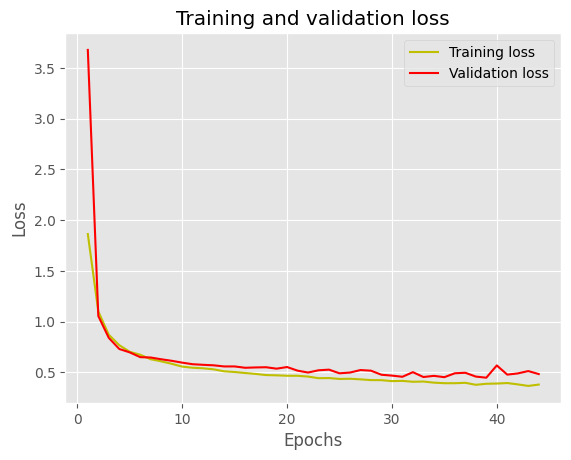

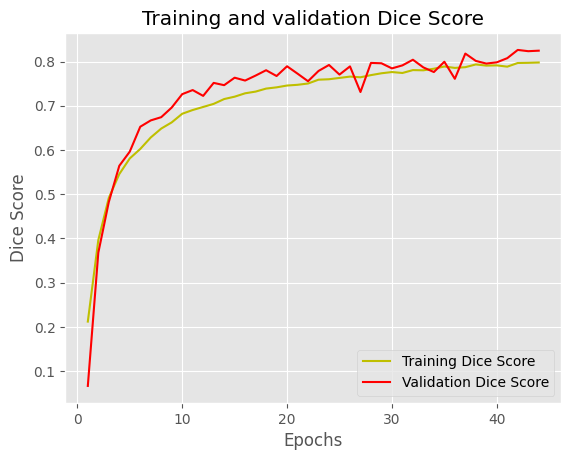

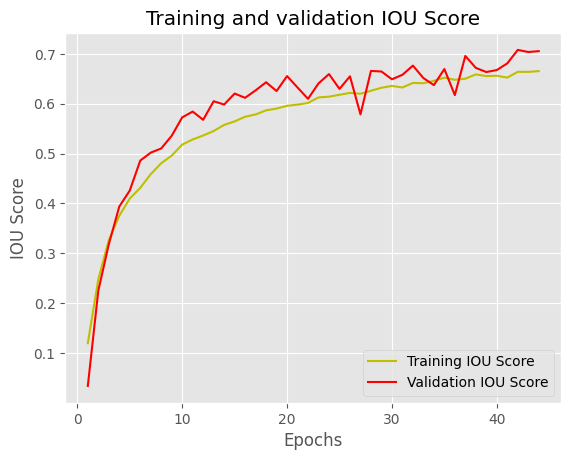

In [ ]:
# Plotting training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)

plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting training and validation dice score
dice = history.history['dice_metric']
val_dice = history.history['val_dice_metric']

plt.plot(epochs, dice, 'y', label='Training Dice Score')
plt.plot(epochs, val_dice, 'r', label='Validation Dice Score')
plt.title('Training and validation Dice Score')
plt.xlabel('Epochs')
plt.ylabel('Dice Score')
plt.legend()
plt.show()

# Plotting training and validation IOU score
IOU = history.history['iou_score']
val_IOU = history.history['val_iou_score']

plt.plot(epochs, IOU, 'y', label='Training IOU Score')
plt.plot(epochs, val_IOU, 'r', label='Validation IOU Score')
plt.title('Training and validation IOU Score')
plt.xlabel('Epochs')
plt.ylabel('IOU Score')
plt.legend()
plt.show()

In [ ]:
import random

def return_test_images(images_path):
    # Get the list of image filenames from the specified directory
    image_filenames = [filename for filename in os.listdir(images_path)]
    # Randomly select 4 image filenames
    test_image_filenames = random.choices(image_filenames, k=4)

    # Load and preprocess the selected test images
    test_images = [Image.open(os.path.join(images_path, filename)).resize((224, 224)) for filename in test_image_filenames]
    processed_test_images = []

    # Process each test image
    for image in test_images:
        preprocessed_image = np.array(image)
        # Normalize the image if it meets the required shape
        if len(preprocessed_image.shape) == 3 and preprocessed_image.shape == (224, 224, 3):
            preprocessed_image = preprocessed_image / 255.0
        else:
            print("Invalid image shape:", preprocessed_image.shape)
            continue
        processed_test_images.append(preprocessed_image)

    processed_test_images = np.array(processed_test_images)

    print("Processed Test Images Shape:", processed_test_images.shape)
    return processed_test_images

# Path to the directory containing test images
test_images_path = '/kaggle/input/rm-segmentation-assignment-dataset/test-30'
test_images = return_test_images(test_images_path)

Processed Test Images Shape: (4, 224, 224, 3)


2024-04-22 10:23:26.902689: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.42855, expected 3.64542
2024-04-22 10:23:26.902741: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 5.87036, expected 5.08723
2024-04-22 10:23:26.902750: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 6.04003, expected 5.2569
2024-04-22 10:23:26.902758: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.22034, expected 5.43722
2024-04-22 10:23:26.902765: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 4.90026, expected 4.11714
2024-04-22 10:23:26.902779: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.21068, expected 4.42756
2024-04-22 10:23:26.902787: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.92061, expected 5.13748
2024-04-22 10:23:26.902794: E external/local_xla/xla/ser

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Original Image Shape: (4, 224, 224, 3)
Predicted Mask Shape: (224, 224, 1)


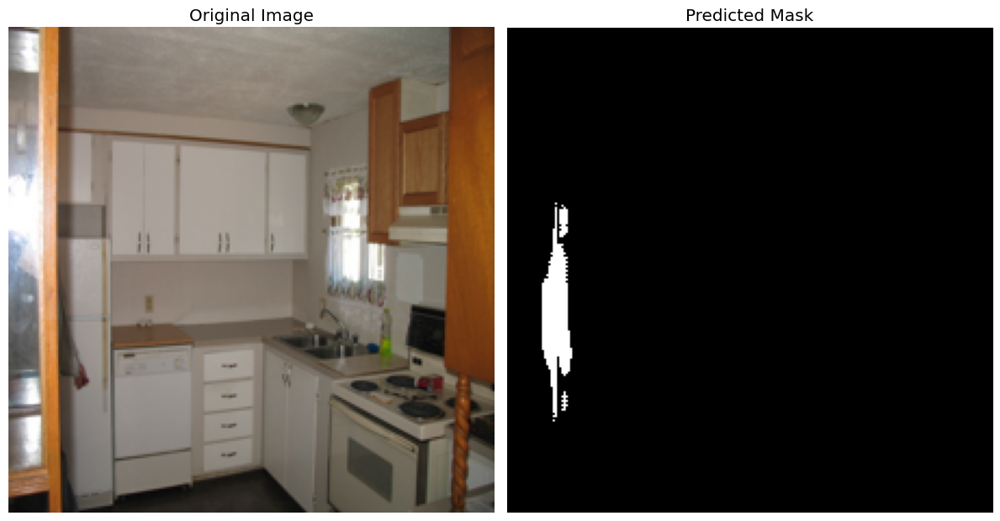

In [ ]:
# Expand the dimensions to make it suitable for model prediction
image_input = np.expand_dims(test_images[0], 0)

# Get the prediction from the model
prediction = model.predict(image_input)[0]
# Convert prediction to a binary mask
predicted_mask = np.expand_dims(prediction.argmax(axis=-1), axis=-1)

# Print the shapes of the original image and the predicted mask
print("Original Image Shape:", test_images.shape)
print("Predicted Mask Shape:", predicted_mask.shape)

# Plotting
plt.figure(figsize=(12, 8))

# Plot the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(test_images[0])
plt.axis('off')

# Plot the predicted mask
plt.subplot(1, 2, 2)
plt.title('Predicted Mask')
plt.imshow(predicted_mask[:, :, 0], cmap='gray')  # Plotting only the first channel of the mask
plt.axis('off')

plt.tight_layout()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Original Image Shape: (224, 224, 3)
Predicted Mask Shape: (224, 224, 1)


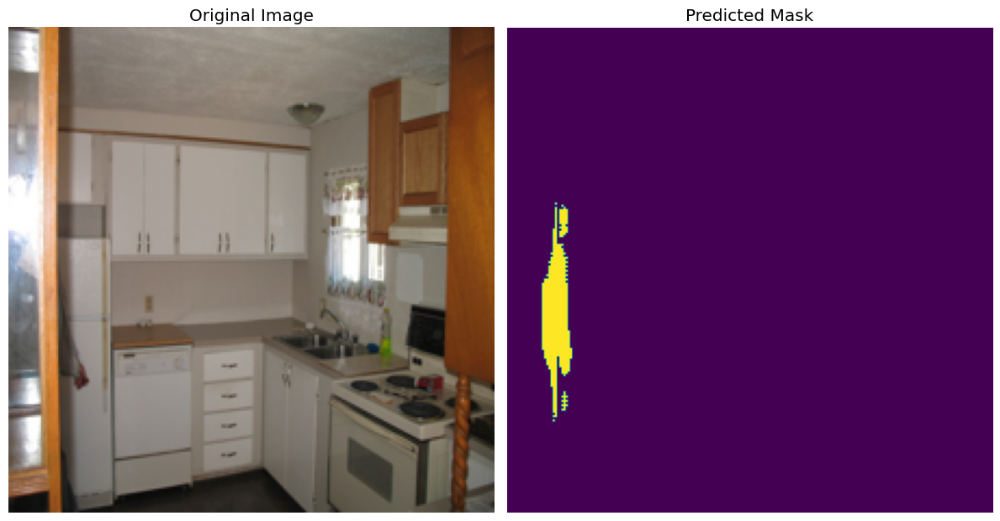

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Image Shape: (224, 224, 3)
Predicted Mask Shape: (224, 224, 1)


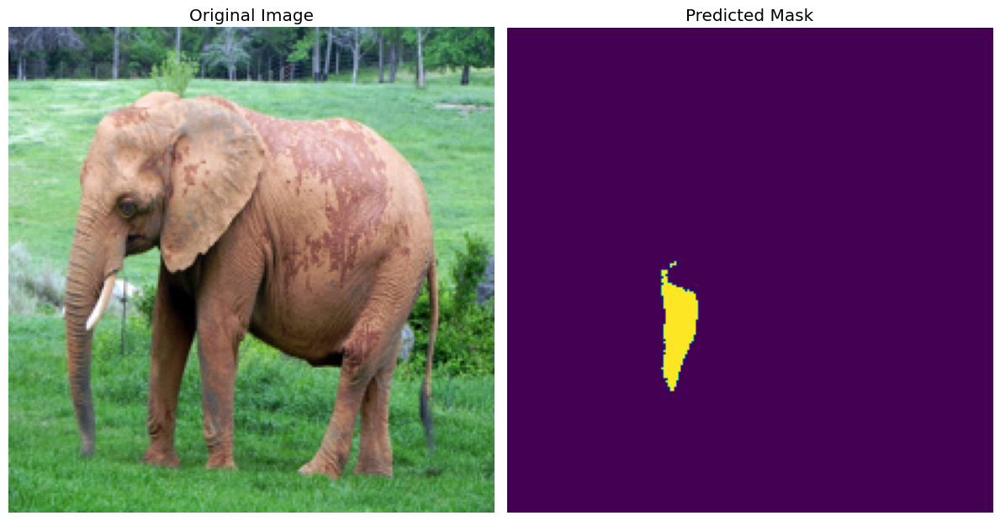

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Image Shape: (224, 224, 3)
Predicted Mask Shape: (224, 224, 1)


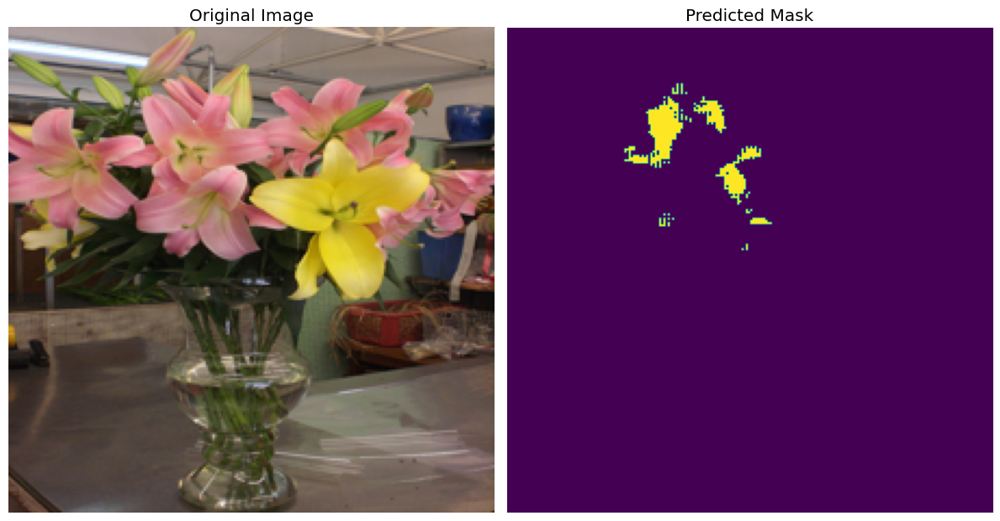

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Original Image Shape: (224, 224, 3)
Predicted Mask Shape: (224, 224, 1)


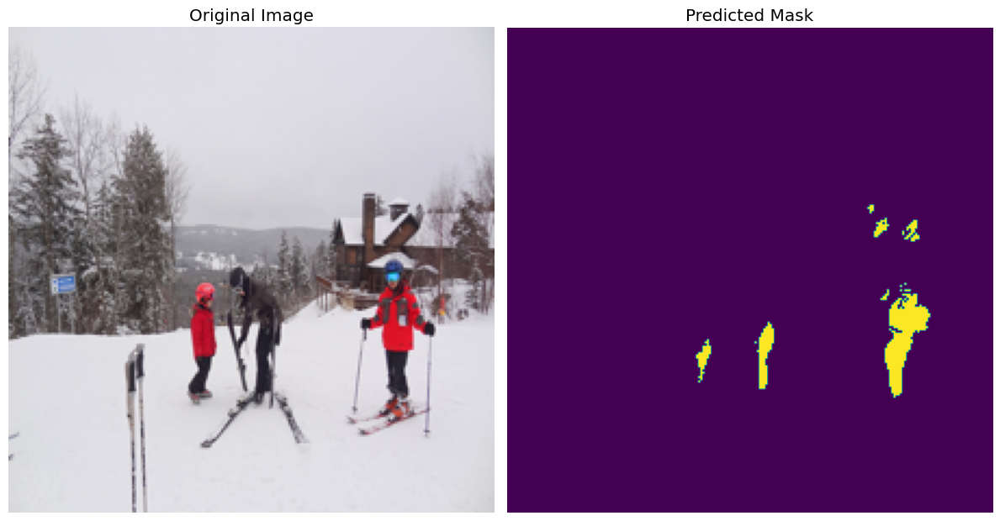

In [ ]:
for i, image in enumerate(test_images):
    # Expand the dimensions to make it suitable for model prediction
    image_input = np.expand_dims(image, 0)

    # Get the prediction from the model
    prediction = model.predict(image_input)[0]
    # Convert prediction to a binary mask
    predicted_mask = np.expand_dims(prediction.argmax(axis=-1), axis=-1)

    # Print the shapes of the original image and the predicted mask
    print("Original Image Shape:", image.shape)
    print("Predicted Mask Shape:", predicted_mask.shape)

    # Plotting
    plt.figure(figsize=(12, 8))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(image)
    plt.axis('off')

    # Plot the predicted mask
    plt.subplot(1, 2, 2)
    plt.title('Predicted Mask')
    plt.imshow(predicted_mask)
    plt.axis('off')

    plt.tight_layout()
    plt.show()